# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(network.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('CNN_RNN_700_1_0_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0

In [17]:
resnet18LSTM_700_1_0 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet50LSTM_700_1_0 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet101LSTM_700_1_0 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

densenet121LSTM_700_1_0 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet169LSTM_700_1_0 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet201LSTM_700_1_0 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

vgg11bnLSTM_700_1_0 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg16bnLSTM_700_1_0 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg19bnLSTM_700_1_0 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0171 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.102 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0528 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1424 	Validation Precision Micro: 0.0
Train Precision Marco: 0.105 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0794 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0519 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0128 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

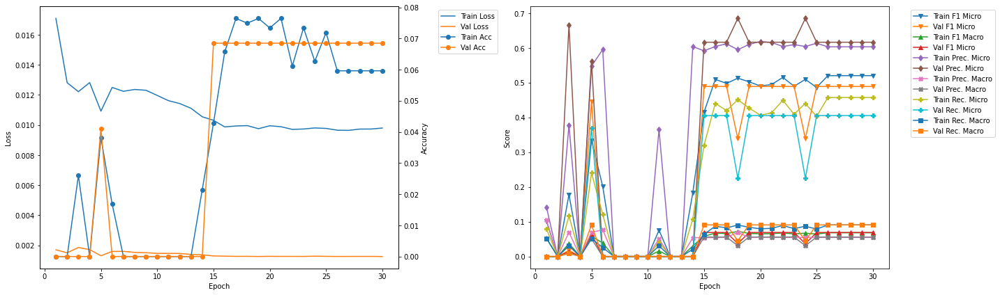

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.93
Train Loss: 0.0129 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0815 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0251 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3556 	Validation Precision Micro: 0.0
Train Precision Marco: 0.09 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.046 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0152 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.05
Train Loss: 0.0124 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

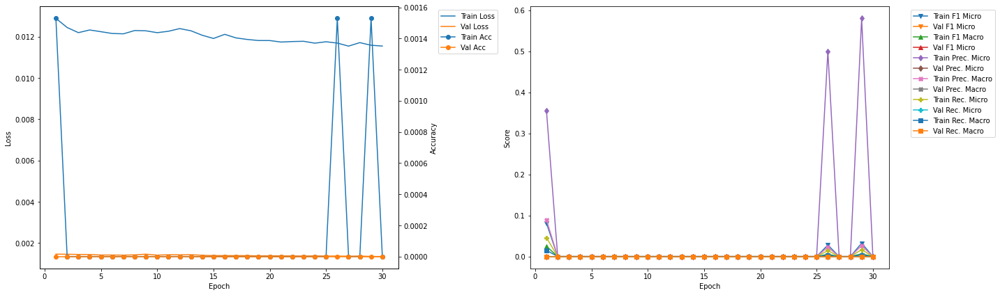

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.68
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0571 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0318 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.228 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1036 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0327 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0323 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.8
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

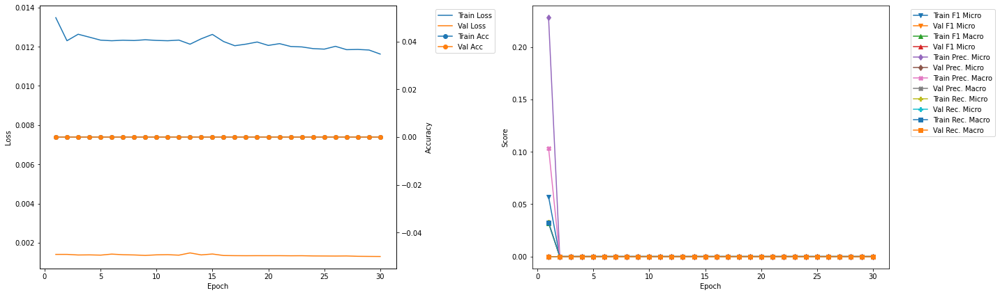

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.43
Train Loss: 0.0135 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0539 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0148 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2971 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0682 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0296 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0118 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.56
Train Loss: 0.0121 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 

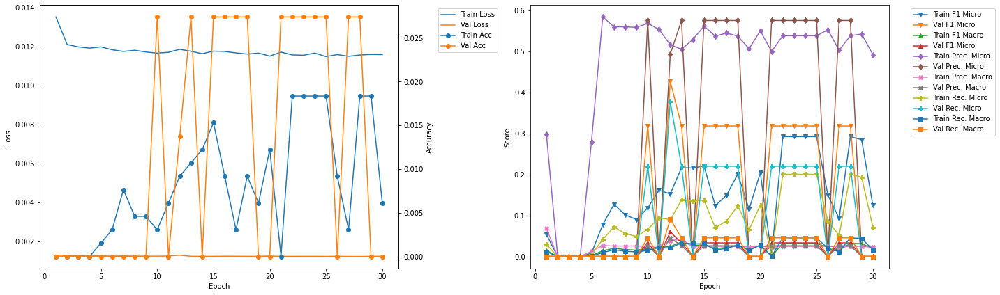

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.18
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1673 	Validation F1 Micro: 0.0
Train F1 Marco: 0.028 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4697 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0418 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1018 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0242 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.31
Train Loss: 0.0118 	Validation Loss: 0.0013
Train Accuracy: 0.0076 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.1552 	Validation F1 Micro: 0.3321
Train F1 Marco: 0.0223 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.53 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0241 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.0909 	Validation Recall Mic

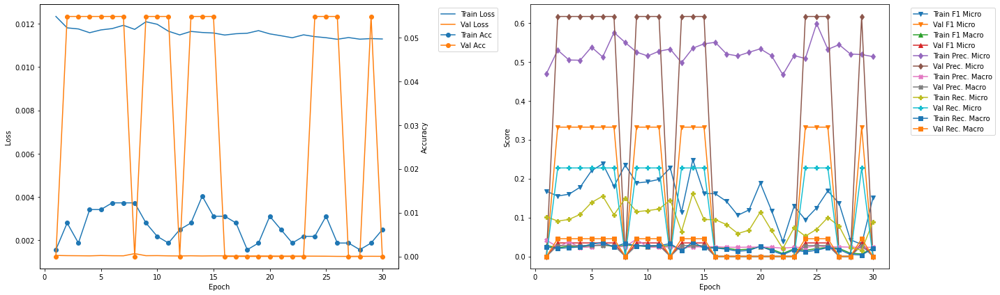

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.94
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0092 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.1907 	Validation F1 Micro: 0.2921
Train F1 Marco: 0.0432 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.3971 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0858 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.1255 	Validation Recall Micro: 0.201
Train Recall Marco: 0.0345 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.06
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2008 	Validation F1 Micro: 0.4059
Train F1 Marco: 0.0265 	Validation F1 Macro: 0.0581
Train Precision Mirco: 0.5646 	Validation Precision Micro: 0.4726
Train Precision Marco: 0.0257 	Validation Precision Macro: 0.043
Train Recall Mirco: 0.1221

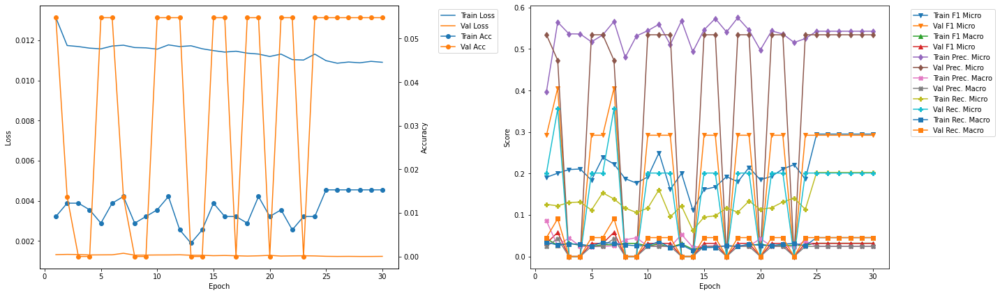

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.69
Train Loss: 0.0121 	Validation Loss: 0.0011
Train Accuracy: 0.0092 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2362 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0485 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4544 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1596 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0434 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.82
Train Loss: 0.0115 	Validation Loss: 0.0011
Train Accuracy: 0.0107 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.2262 	Validation F1 Micro: 0.3333
Train F1 Marco: 0.028 	Validation F1 Macro: 0.0322
Train Precision Mirco: 0.5368 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0244 	Validation Precision Macro: 0.0249
Train Recall Mirco: 0.1433 	Validation Recall 

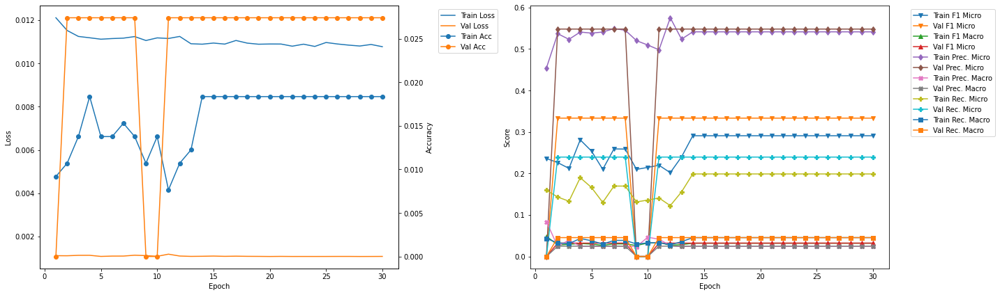

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.45
Train Loss: 0.0117 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2382 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0496 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4544 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0803 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1614 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0435 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.58
Train Loss: 0.0108 	Validation Loss: 0.0012
Train Accuracy: 0.0137 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2208 	Validation F1 Micro: 0.2934
Train F1 Marco: 0.0369 	Validation F1 Macro: 0.0314
Train Precision Mirco: 0.5422 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0463 	Validation Precision Macro: 0.024
Train Recall Mirco: 0.1386 	Validation Recall Mic

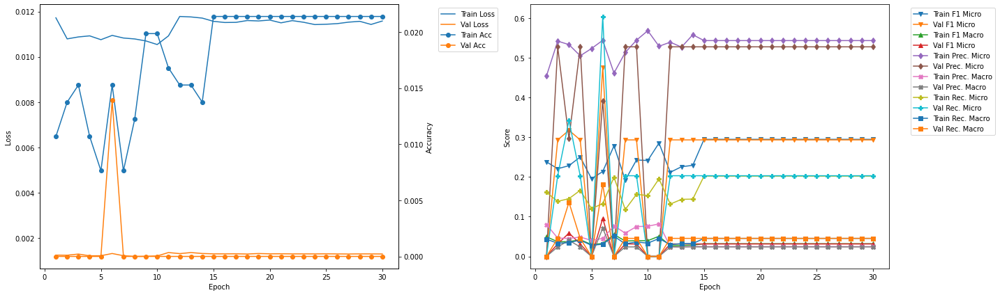

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.22
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1924 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0292 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.515 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0384 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1183 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0271 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.34
Train Loss: 0.0117 	Validation Loss: 0.0014
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1578 	Validation F1 Micro: 0.2734
Train F1 Marco: 0.0223 	Validation F1 Macro: 0.0314
Train Precision Mirco: 0.5367 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0244 	Validation Precision Macro: 0.024
Train Recall Mirco: 0.0925 	Validation Recall Micr

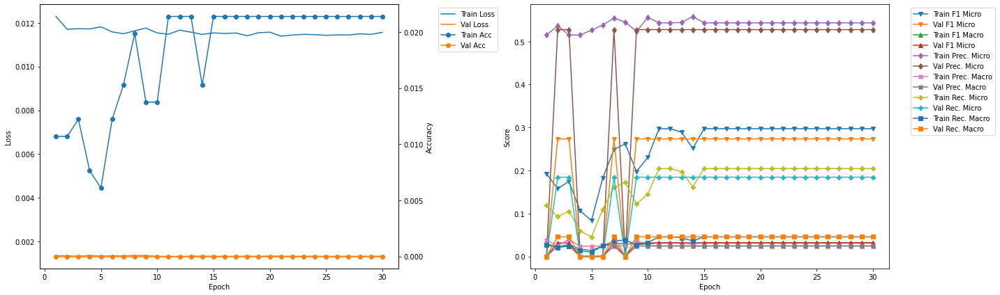

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.97
Train Loss: 0.0125 	Validation Loss: 0.0012
Train Accuracy: 0.0076 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.2055 	Validation F1 Micro: 0.2869
Train F1 Marco: 0.0311 	Validation F1 Macro: 0.0297
Train Precision Mirco: 0.5531 	Validation Precision Micro: 0.4861
Train Precision Marco: 0.0404 	Validation Precision Macro: 0.0221
Train Recall Mirco: 0.1262 	Validation Recall Micro: 0.2035
Train Recall Marco: 0.0291 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.1
Train Loss: 0.0118 	Validation Loss: 0.0012
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2315 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0283 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5438 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0247 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.147 	Validation R

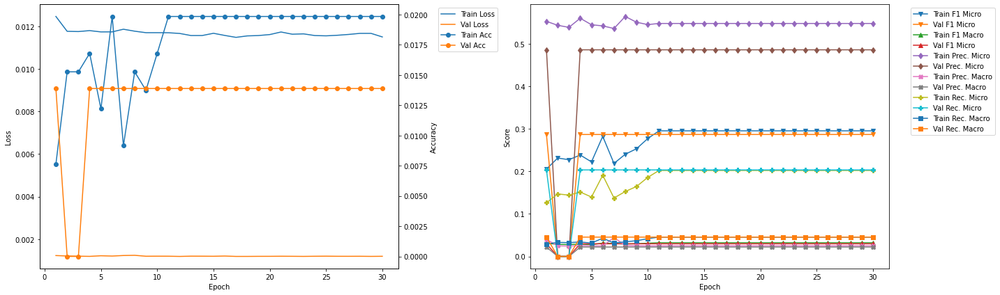

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 15
Train Loss: 0.0103 	Validation Loss: 0.0013
Train Accuracy: 0.0428 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4153 	Validation F1 Micro: 0.4891
Train F1 Marco: 0.0583 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.5916 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.32 	Validation Recall Micro: 0.4054
Train Recall Marco: 0.0641 	Validation Recall Macro: 0.0909


In [19]:
resnet18LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0178 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0581 	Validation F1 Micro: 0.0
Train F1 Marco: 0.04 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1232 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1225 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.038 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0492 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

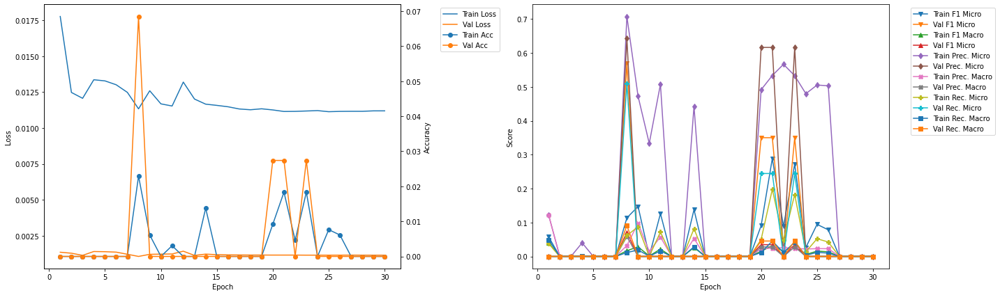

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.37
Train Loss: 0.0115 	Validation Loss: 0.0011
Train Accuracy: 0.0061 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.0895 	Validation F1 Micro: 0.2667
Train F1 Marco: 0.0147 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.486 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0221 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.0493 	Validation Recall Micro: 0.1868
Train Recall Marco: 0.011 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.51
Train Loss: 0.0111 	Validation Loss: 0.0011
Train Accuracy: 0.0153 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2718 	Validation F1 Micro: 0.246
Train F1 Marco: 0.0309 	Validation F1 Macro: 0.0271
Train Precision Mirco: 0.553 	Validation Precision Micro: 0.4429
Train Precision Marco: 0.0251 	Validation Precision Macro: 0.0201
Train Recall Mirco: 0.1802 	Va

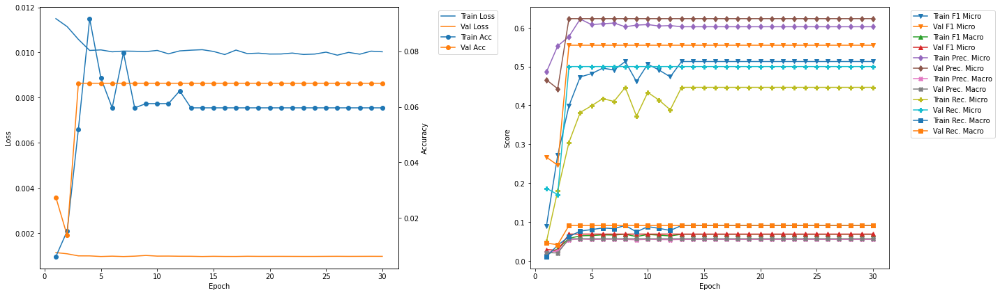

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.59
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4948 	Validation F1 Micro: 0.4855
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4184 	Validation Recall Micro: 0.42
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.73
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5169 	Validation F1 Micro: 0.3223
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.4476 	Va

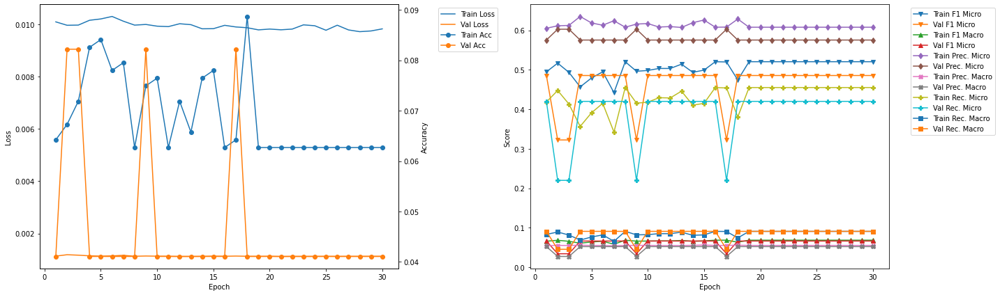

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.569697 --> 0.573964).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.81
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.574
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3932 	Validation Recall Micro: 0.5052
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.95
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.574
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6644
Train Precision M

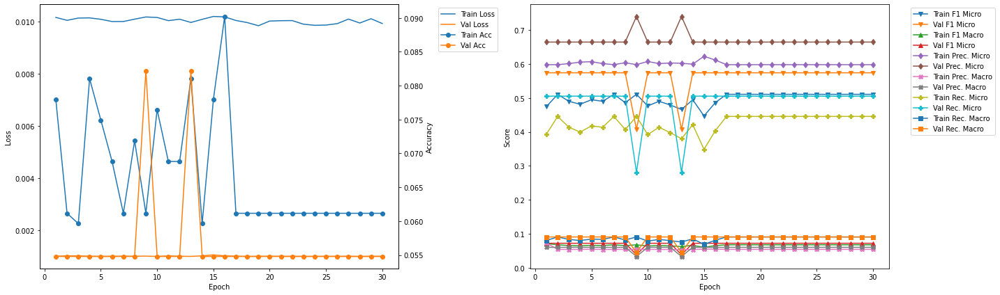

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.03
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.5486
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0536 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3987 	Validation Recall Micro: 0.4706
Train Recall Marco: 0.0793 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.17
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4624 	Validation F1 Micro: 0.5486
Train F1 Marco: 0.0623 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.631 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3649 	

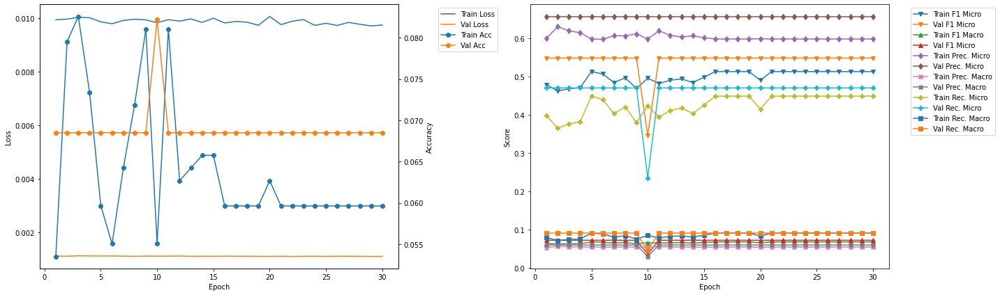

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.25
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.4924
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6156 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4303 	Validation Recall Micro: 0.4426
Train Recall Marco: 0.0859 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.39
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.3437
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0342
Train Precision Mirco: 0.6134 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0274
Train Recall Mirco: 0.4201

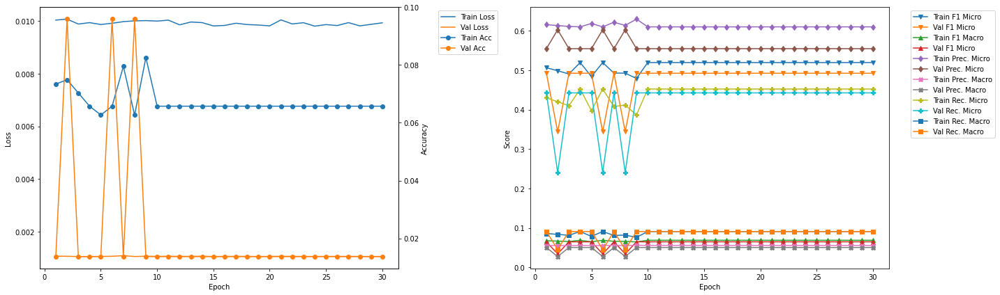

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.48
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.3695
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4116 	Validation Recall Micro: 0.2614
Train Recall Marco: 0.0827 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.62
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.4845
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0628
Train Precision Mirco: 0.6258 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4003 	

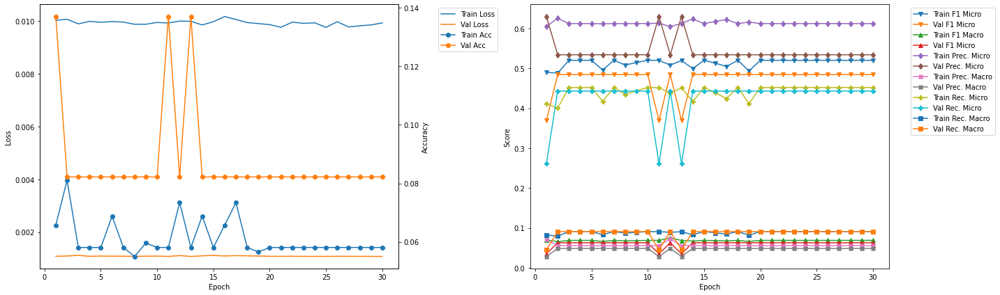

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.7
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0694 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0713 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4269 	Validation Recall Micro: 0.4416
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.84
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4811 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4 	V

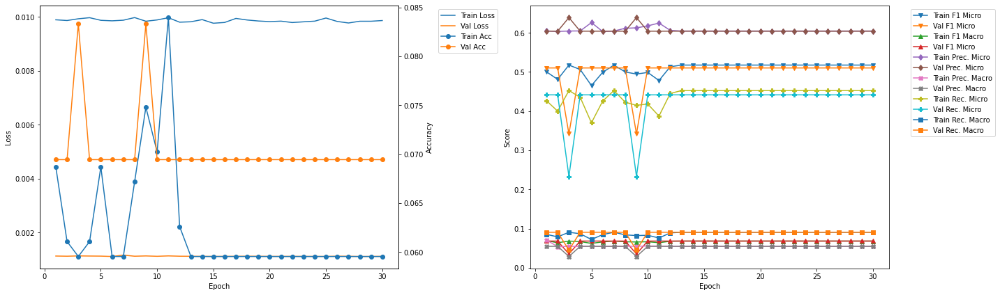

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.93
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4806 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3931 	Validation Recall Micro: 0.4257
Train Recall Marco: 0.0774 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.07
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4527 	Va

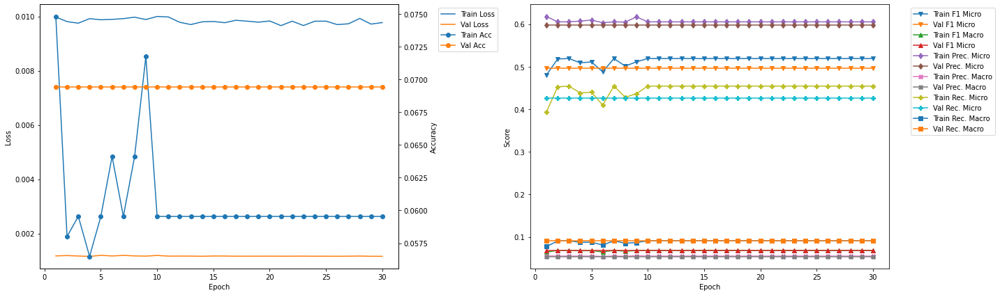

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.15
Train Loss: 0.0097 	Validation Loss: 0.0014
Train Accuracy: 0.0626 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5225 	Validation F1 Micro: 0.4582
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4564 	Validation Recall Micro: 0.3744
Train Recall Marco: 0.0898 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.29
Train Loss: 0.0097 	Validation Loss: 0.0014
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5241 	Validation F1 Micro: 0.4582
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4

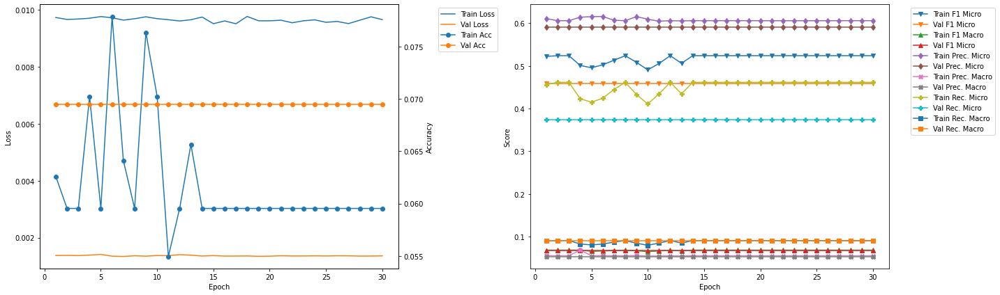

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.574
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0724
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.3932 	Validation Recall Micro: 0.5052
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909


In [20]:
resnet50LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0251 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1283 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0834 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1386 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1216 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1195 	Validation Recall Micro: 0.0
Train Recall Marco: 0.1185 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0116 	Validation Loss: 0.0012
Train Accuracy: 0.0275 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2781 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0439 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5613 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0484 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1849 	Validation Recall Micro: 0.0
Train Re

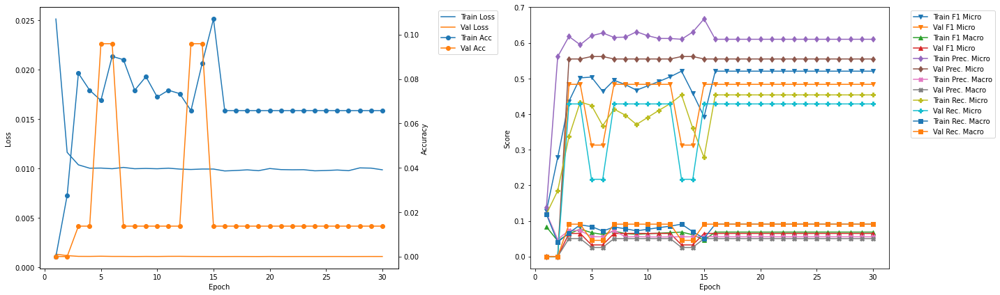

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.97
Train Loss: 0.0126 	Validation Loss: 0.001
Train Accuracy: 0.0122 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.1784 	Validation F1 Micro: 0.4496
Train F1 Marco: 0.0378 	Validation F1 Macro: 0.0402
Train Precision Mirco: 0.4323 	Validation Precision Micro: 0.7945
Train Precision Marco: 0.0705 	Validation Precision Macro: 0.0361
Train Recall Mirco: 0.1124 	Validation Recall Micro: 0.3135
Train Recall Marco: 0.0285 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.12
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0795 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4684 	Validation F1 Micro: 0.4496
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.0402
Train Precision Mirco: 0.5919 	Validation Precision Micro: 0.7945
Train Precision Marco: 0.0735 	Validation Precision Macro: 0.0361
Train Recall Mirco: 0.3876 	

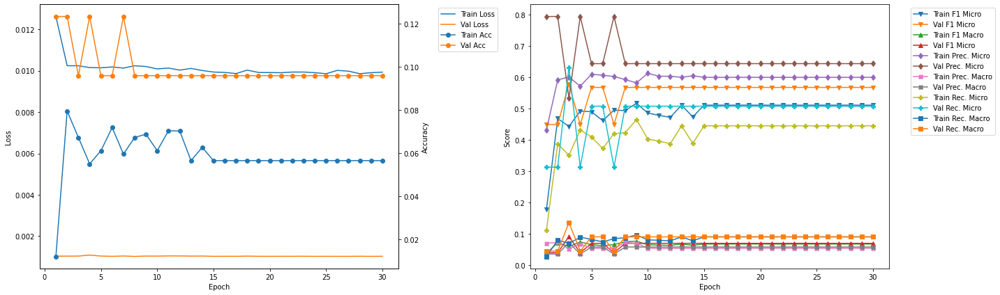

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.75
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4486 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0594 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6195 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.3516 	Validation Recall Micro: 0.4233
Train Recall Marco: 0.0677 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.9
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4491 	Validation F1 Micro: 0.3264
Train F1 Marco: 0.0608 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.358 	Va

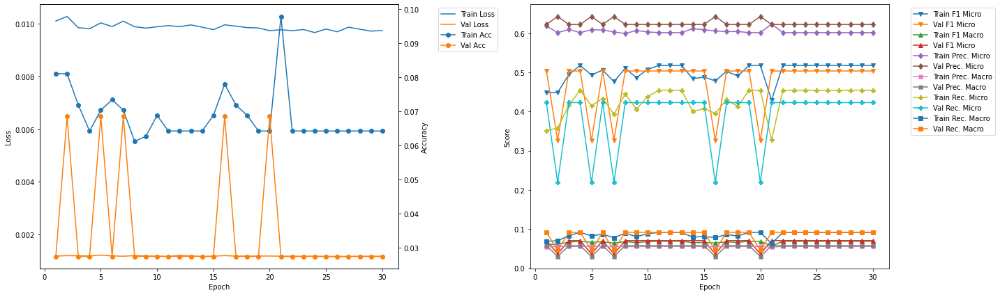

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.52
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5002 	Validation F1 Micro: 0.4857
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4234 	Validation Recall Micro: 0.4167
Train Recall Marco: 0.0838 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.68
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.4857
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.42

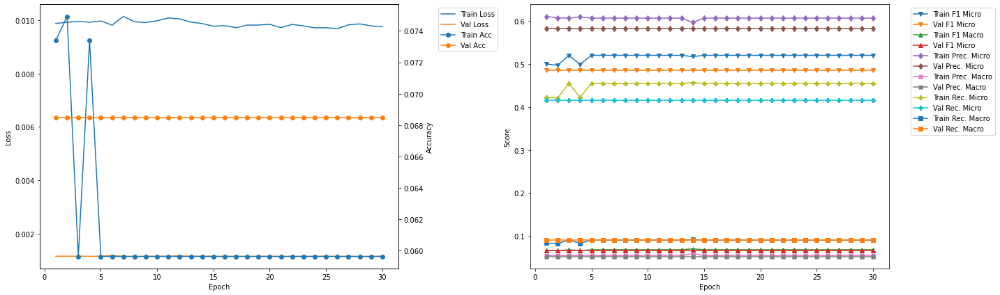

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.3
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0627 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0592 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.451 	Validation Recall Micro: 0.4678
Train Recall Marco: 0.0923 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.46
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5047
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0642
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4499 	Va

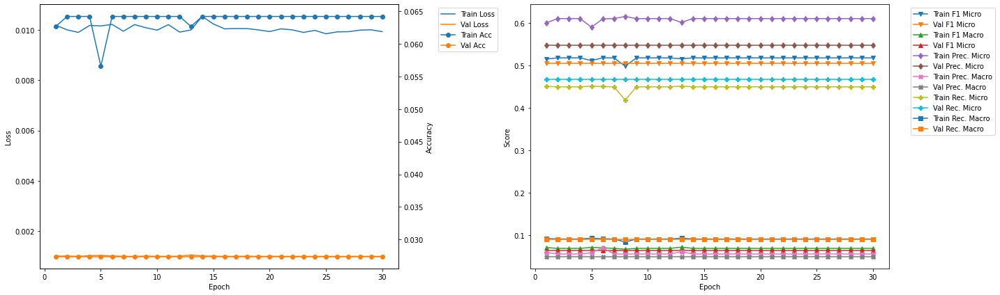

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.08
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5118 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0693 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.5934 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0567 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4499 	Validation Recall Micro: 0.4709
Train Recall Marco: 0.0916 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.24
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5144 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0732 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.5964 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.064 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4522

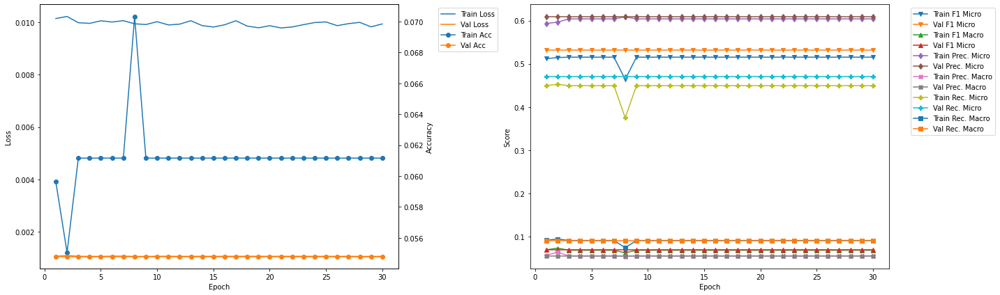

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.85
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0581 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.519 	Validation F1 Micro: 0.4669
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0573 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4576 	Validation Recall Micro: 0.403
Train Recall Marco: 0.0916 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.01
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5226 	Validation F1 Micro: 0.4669
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.457 

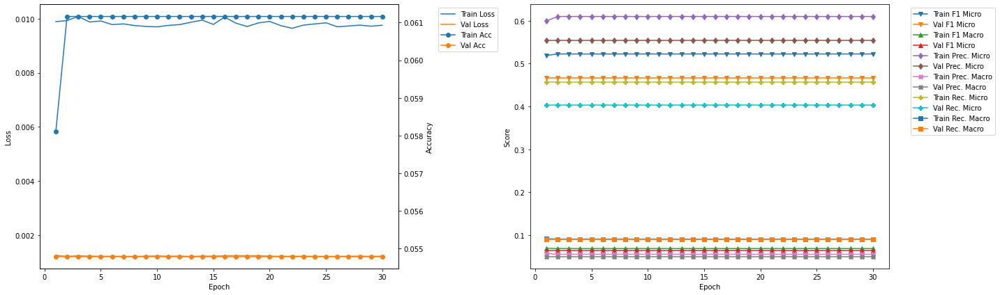

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.63
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5101 	Validation F1 Micro: 0.5791
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.4453 	Validation Recall Micro: 0.5079
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.79
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5101 	Validation F1 Micro: 0.5791
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.6736
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0612
Train Recall Mirco: 0.4453 	

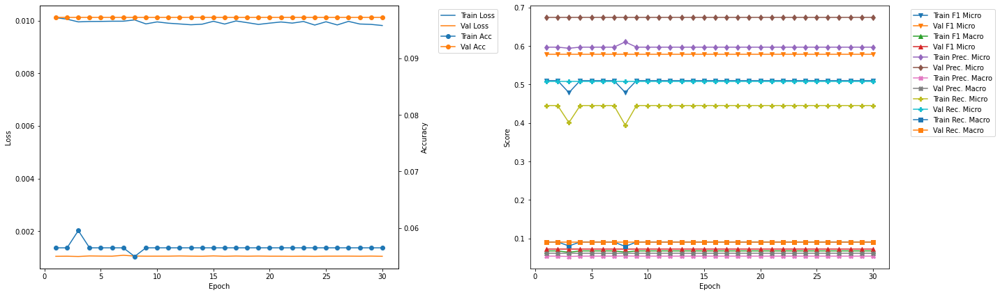

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.41
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5075 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.5762 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0591 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4534 	Validation Recall Micro: 0.4706
Train Recall Marco: 0.0957 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.57
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.5317
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0686
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4494

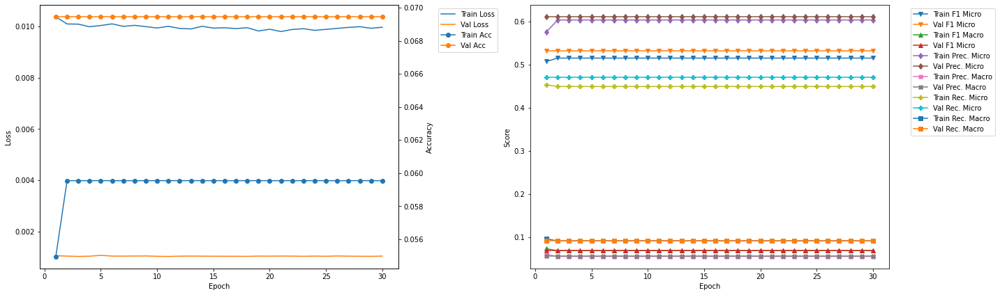

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.19
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4538 	Validation Recall Micro: 0.4326
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.34
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4538 	Val

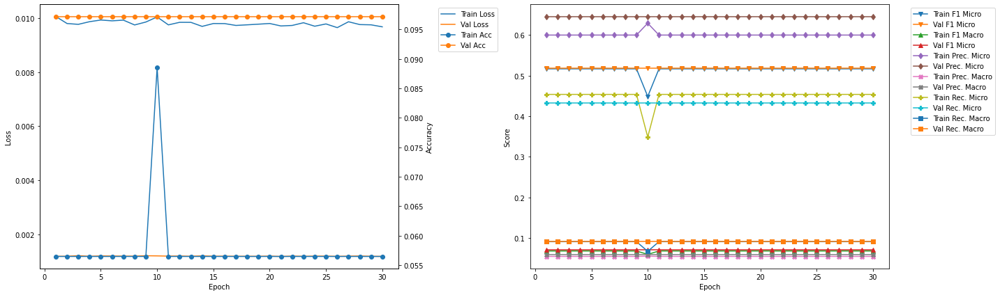

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 3
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4436 	Validation F1 Micro: 0.5792
Train F1 Marco: 0.0597 	Validation F1 Macro: 0.0921
Train Precision Mirco: 0.6016 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.053 	Validation Precision Macro: 0.0729
Train Recall Mirco: 0.3513 	Validation Recall Micro: 0.6324
Train Recall Marco: 0.0698 	Validation Recall Macro: 0.1364


In [21]:
resnet101LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0169 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0078 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0112 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.125 	Validation Precision Micro: 0.0
Train Precision Marco: 0.033 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.004 	Validation Recall Micro: 0.0
Train Recall Marco: 0.007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0057 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0048 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2174 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2045 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0029 	Validation Recall Micro: 0.0
Train Recall Ma

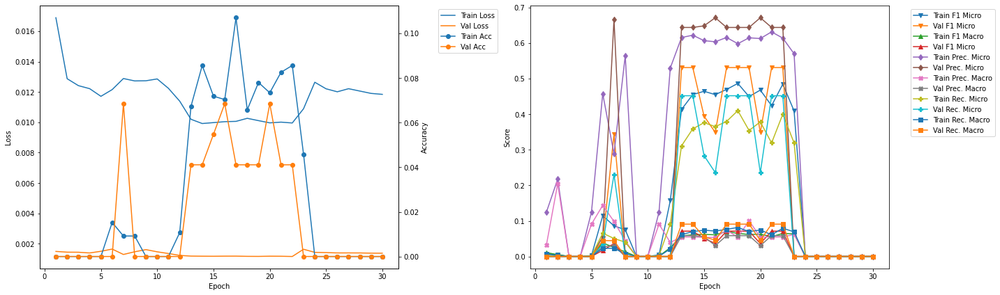

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.77
Train Loss: 0.0119 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.2657
Train F1 Marco: 0.001 	Validation F1 Macro: 0.03
Train Precision Mirco: 0.2222 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0224
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.1818
Train Recall Marco: 0.0005 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.92
Train Loss: 0.0112 	Validation Loss: 0.0012
Train Accuracy: 0.026 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.2766 	Validation F1 Micro: 0.3111
Train F1 Marco: 0.0384 	Validation F1 Macro: 0.0332
Train Precision Mirco: 0.5408 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0685 	Validation Precision Macro: 0.0265
Train Recall Mirco: 0.1858 	Valid

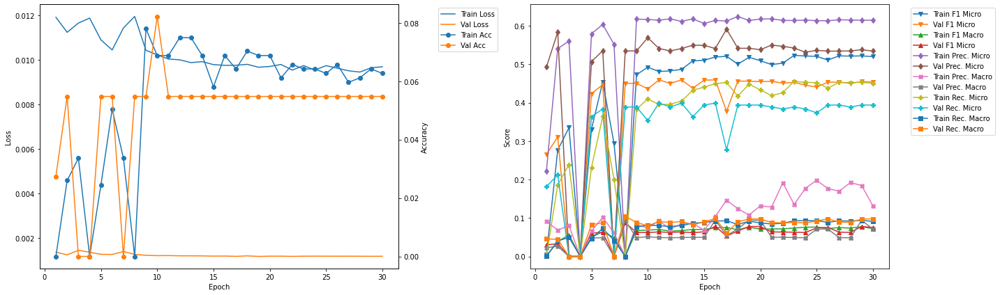

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.531073 --> 0.547550).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.37
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4329 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.079
Train Precision Mirco: 0.6014 	Validation Precision Micro: 0.6552
Train Precision Marco: 0.1157 	Validation Precision Macro: 0.1046
Train Recall Mirco: 0.3381 	Validation Recall Micro: 0.4703
Train Recall Marco: 0.0696 	Validation Recall Macro: 0.0943

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.52
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4845 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0803 	Validation F1 Macro: 0.0758
Train Precision Mirco: 0.5809 	Validation Precision Micro: 0.6423
Train Precisi

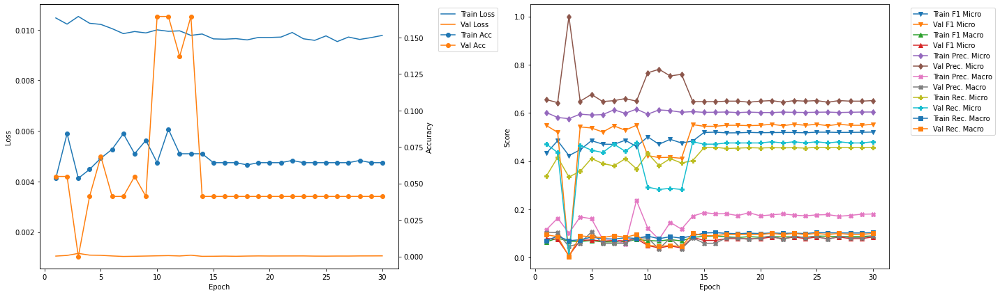

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.0
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4896 	Validation F1 Micro: 0.5517
Train F1 Marco: 0.0813 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6198 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.1694 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.4046 	Validation Recall Micro: 0.4752
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.15
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4835 	Validation F1 Micro: 0.5517
Train F1 Marco: 0.0823 	Validation F1 Macro: 0.0795
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.2266 	Validation Precision Macro: 0.105
Train Recall Mirco: 0.3989 	V

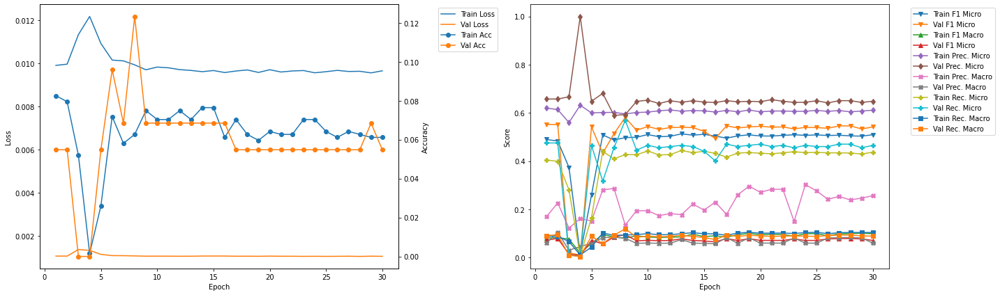

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.6
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4977 	Validation F1 Micro: 0.5521
Train F1 Marco: 0.0879 	Validation F1 Macro: 0.1043
Train Precision Mirco: 0.5995 	Validation Precision Micro: 0.5699
Train Precision Marco: 0.136 	Validation Precision Macro: 0.1003
Train Recall Mirco: 0.4254 	Validation Recall Micro: 0.5354
Train Recall Marco: 0.0943 	Validation Recall Macro: 0.1247

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.76
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.488 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.1022 	Validation F1 Macro: 0.0784
Train Precision Mirco: 0.599 	Validation Precision Micro: 0.6107
Train Precision Marco: 0.2352 	Validation Precision Macro: 0.0726
Train Recall Mirco: 0.4117 	Va

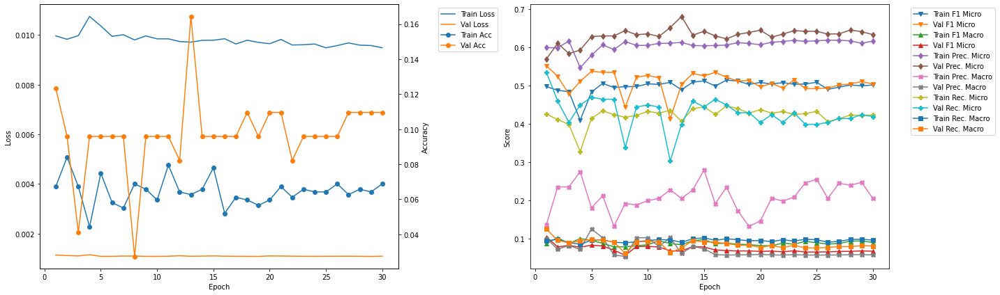

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.21
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.502 	Validation F1 Micro: 0.4783
Train F1 Marco: 0.092 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6063
Train Precision Marco: 0.1888 	Validation Precision Macro: 0.0547
Train Recall Mirco: 0.4298 	Validation Recall Micro: 0.3949
Train Recall Marco: 0.0964 	Validation Recall Macro: 0.0811

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.36
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.4865
Train F1 Marco: 0.0954 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6006 	Validation Precision Micro: 0.587
Train Precision Marco: 0.2559 	Validation Precision Macro: 0.0538
Train Recall Mirco: 0.4275 

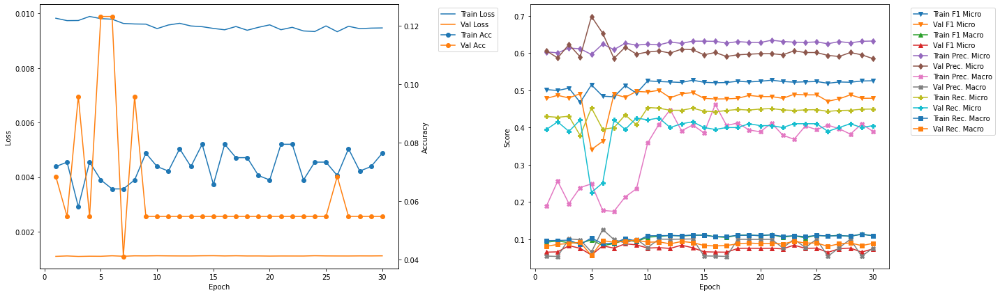

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.81
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0918 	Validation F1 Macro: 0.1328
Train Precision Mirco: 0.6163 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.1778 	Validation Precision Macro: 0.2205
Train Recall Mirco: 0.4228 	Validation Recall Micro: 0.4171
Train Recall Marco: 0.0976 	Validation Recall Macro: 0.1278

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.96
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4991 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0964 	Validation F1 Macro: 0.1321
Train Precision Mirco: 0.6266 	Validation Precision Micro: 0.5742
Train Precision Marco: 0.2697 	Validation Precision Macro: 0.2337
Train Recall Mirco: 0.41

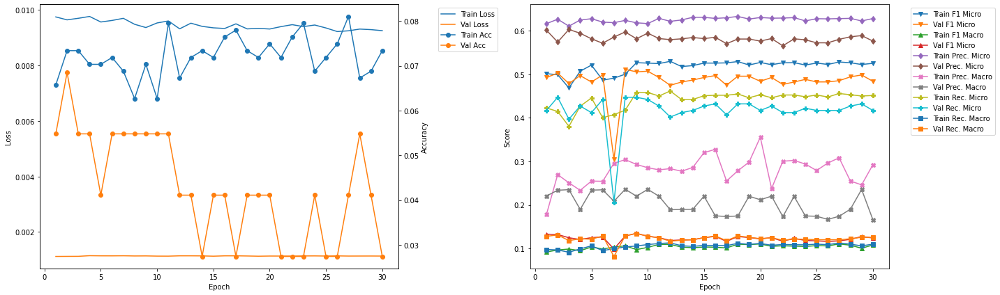

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.4
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.449 	Validation F1 Micro: 0.5581
Train F1 Marco: 0.0907 	Validation F1 Macro: 0.1173
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.64
Train Precision Marco: 0.2078 	Validation Precision Macro: 0.1599
Train Recall Mirco: 0.3577 	Validation Recall Micro: 0.4948
Train Recall Marco: 0.0858 	Validation Recall Macro: 0.1227

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.56
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5124 	Validation F1 Micro: 0.5579
Train F1 Marco: 0.1052 	Validation F1 Macro: 0.1125
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.6573
Train Precision Marco: 0.2974 	Validation Precision Macro: 0.1364
Train Recall Mirco: 0.4432 	Val

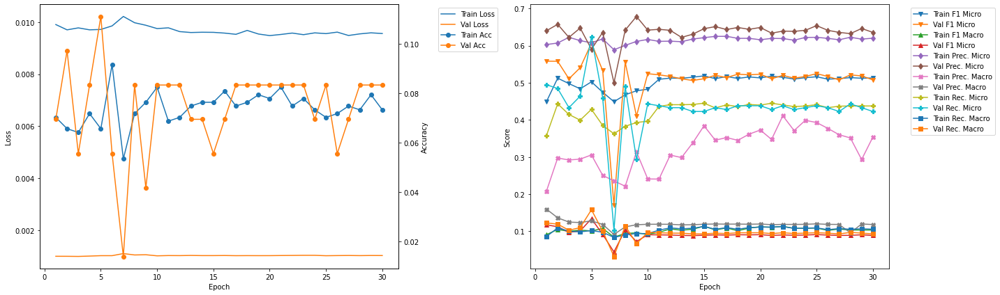

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4695 	Validation F1 Micro: 0.4667
Train F1 Marco: 0.0971 	Validation F1 Macro: 0.101
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.5066
Train Precision Marco: 0.1853 	Validation Precision Macro: 0.1112
Train Recall Mirco: 0.381 	Validation Recall Micro: 0.4326
Train Recall Marco: 0.0915 	Validation Recall Macro: 0.1122

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.16
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.478
Train F1 Marco: 0.1045 	Validation F1 Macro: 0.0938
Train Precision Mirco: 0.6188 	Validation Precision Micro: 0.5429
Train Precision Marco: 0.3358 	Validation Precision Macro: 0.1403
Train Recall Mirco: 0.4121 	V

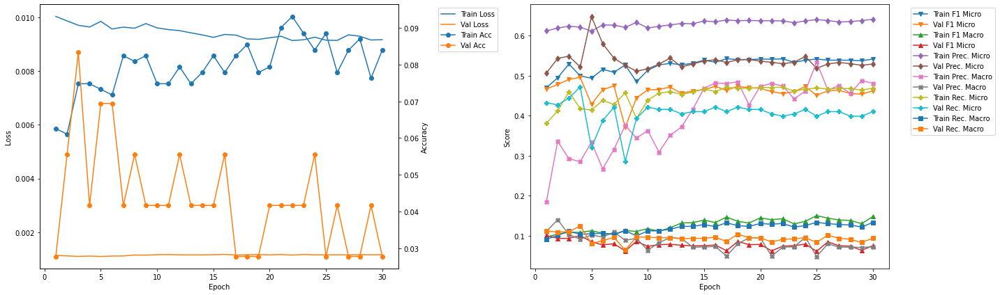

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.61
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4928 	Validation F1 Micro: 0.53
Train F1 Marco: 0.1184 	Validation F1 Macro: 0.101
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.4096 	Validation Precision Macro: 0.1439
Train Recall Mirco: 0.4143 	Validation Recall Micro: 0.4855
Train Recall Marco: 0.1071 	Validation Recall Macro: 0.1104

Epoch 2 	Learning Rate: 0.01 	Time (min): 41.76
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5109 	Validation F1 Micro: 0.535
Train F1 Marco: 0.1223 	Validation F1 Macro: 0.0964
Train Precision Mirco: 0.6186 	Validation Precision Micro: 0.5957
Train Precision Marco: 0.3835 	Validation Precision Macro: 0.1349
Train Recall Mirco: 0.4352 	V

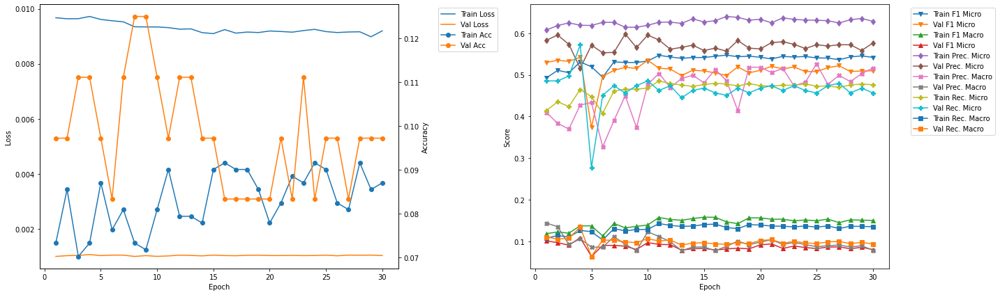

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 5
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5025 	Validation F1 Micro: 0.6065
Train F1 Marco: 0.101 	Validation F1 Macro: 0.1341
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5902
Train Precision Marco: 0.3057 	Validation Precision Macro: 0.1282
Train Recall Mirco: 0.4284 	Validation Recall Micro: 0.6237
Train Recall Marco: 0.102 	Validation Recall Macro: 0.1581


In [22]:
densenet121LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0167 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0991 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1436 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1315 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0757 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0613 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

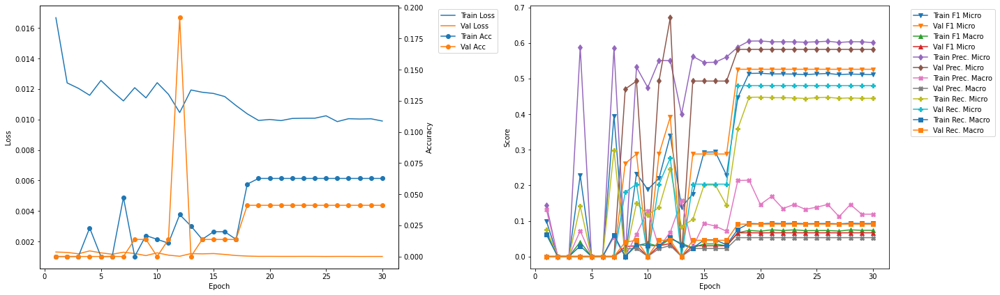

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.43
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4628 	Validation F1 Micro: 0.503
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6161 	Validation Precision Micro: 0.6058
Train Precision Marco: 0.1624 	Validation Precision Macro: 0.0547
Train Recall Mirco: 0.3706 	Validation Recall Micro: 0.4301
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0853

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.6
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4502 	Validation F1 Micro: 0.5192
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6165 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1007 	Validation Precision Macro: 0.0551
Train Recall Mirco: 0.3546 	Va

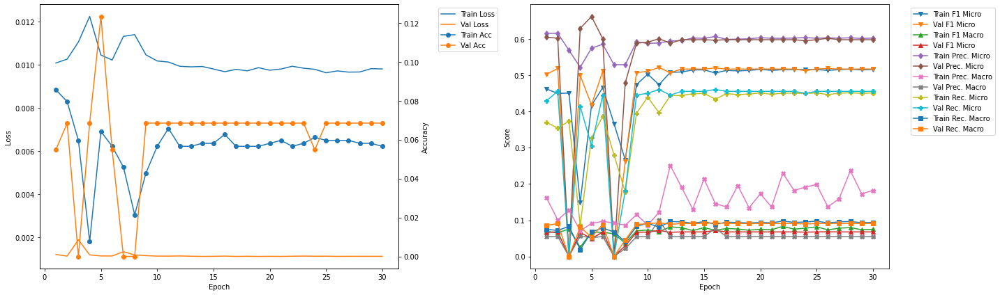

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.63
Train Loss: 0.0105 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4214 	Validation F1 Micro: 0.4915
Train F1 Marco: 0.0698 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.112 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3237 	Validation Recall Micro: 0.4183
Train Recall Marco: 0.0685 	Validation Recall Macro: 0.0889

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.8
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4624 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.6138
Train Precision Marco: 0.1612 	Validation Precision Macro: 0.0558
Train Recall Mirco: 0.3726 	V

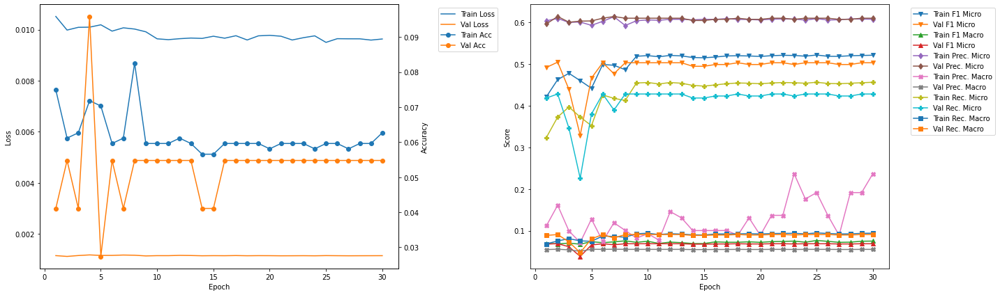

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.526316 --> 0.576271).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 15.83
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4732 	Validation F1 Micro: 0.5763
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0747
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.1501 	Validation Precision Macro: 0.0635
Train Recall Mirco: 0.3882 	Validation Recall Micro: 0.4904
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4711 	Validation F1 Micro: 0.4152
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0475
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.7407
Train Precision 

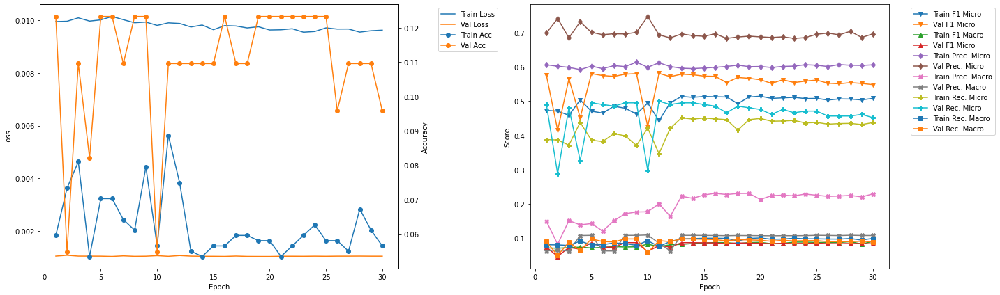

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.06
Train Loss: 0.0102 	Validation Loss: 0.0013
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.4917
Train F1 Marco: 0.0811 	Validation F1 Macro: 0.0869
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.5973
Train Precision Marco: 0.1647 	Validation Precision Macro: 0.0997
Train Recall Mirco: 0.3968 	Validation Recall Micro: 0.4178
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.1024

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.24
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5071 	Validation F1 Micro: 0.4944
Train F1 Marco: 0.0805 	Validation F1 Macro: 0.0877
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.1854 	Validation Precision Macro: 0.1459
Train Recall Mirco: 0.43

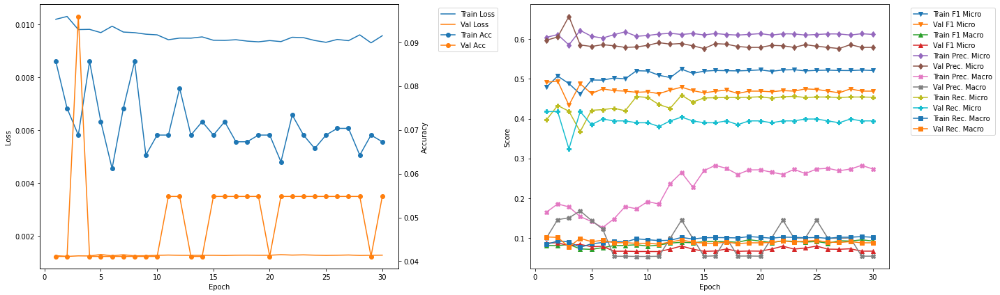

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.26
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4776 	Validation F1 Micro: 0.5072
Train F1 Marco: 0.0729 	Validation F1 Macro: 0.1132
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.5906
Train Precision Marco: 0.0994 	Validation Precision Macro: 0.2342
Train Recall Mirco: 0.3928 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.117

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.44
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4936 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0751 	Validation F1 Macro: 0.1023
Train Precision Mirco: 0.6268 	Validation Precision Micro: 0.5867
Train Precision Marco: 0.1245 	Validation Precision Macro: 0.1666
Train Recall Mirco: 0.4071

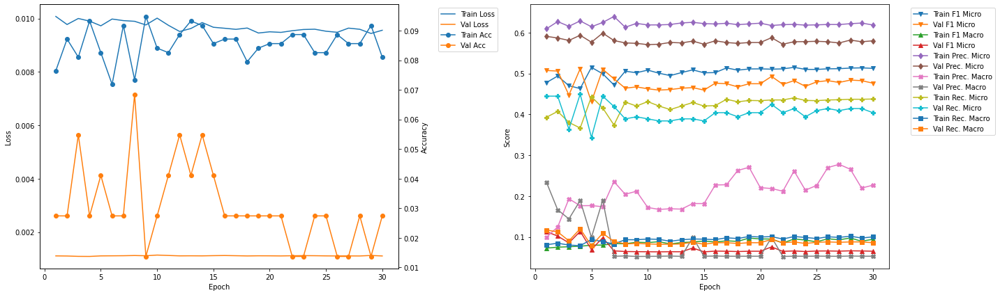

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.47
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5007 	Validation F1 Micro: 0.5061
Train F1 Marco: 0.0902 	Validation F1 Macro: 0.1202
Train Precision Mirco: 0.6196 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.2071 	Validation Precision Macro: 0.1582
Train Recall Mirco: 0.4201 	Validation Recall Micro: 0.4536
Train Recall Marco: 0.0956 	Validation Recall Macro: 0.1286

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.64
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.4906
Train F1 Marco: 0.0889 	Validation F1 Macro: 0.065
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.5778
Train Precision Marco: 0.1772 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4354 

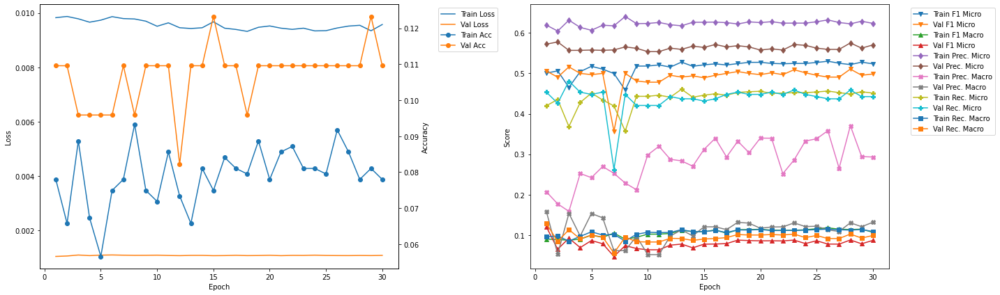

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.69
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4881 	Validation F1 Micro: 0.5333
Train F1 Marco: 0.0922 	Validation F1 Macro: 0.1099
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6197
Train Precision Marco: 0.2177 	Validation Precision Macro: 0.1547
Train Recall Mirco: 0.407 	Validation Recall Micro: 0.4681
Train Recall Marco: 0.0941 	Validation Recall Macro: 0.1143

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.86
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.5401
Train F1 Marco: 0.0968 	Validation F1 Macro: 0.0992
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.6107
Train Precision Marco: 0.2673 	Validation Precision Macro: 0.147
Train Recall Mirco: 0.4184 	V

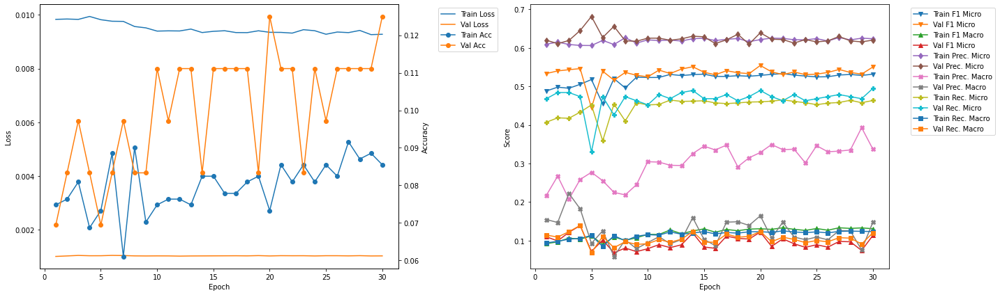

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.89
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5135 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.1057 	Validation F1 Macro: 0.103
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.5724
Train Precision Marco: 0.3049 	Validation Precision Macro: 0.1806
Train Recall Mirco: 0.4389 	Validation Recall Micro: 0.4462
Train Recall Marco: 0.1062 	Validation Recall Macro: 0.1129

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.06
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0916 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5135 	Validation F1 Micro: 0.4258
Train F1 Marco: 0.0966 	Validation F1 Macro: 0.0818
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.5739
Train Precision Marco: 0.2158 	Validation Precision Macro: 0.1545
Train Recall Mirco: 0.438

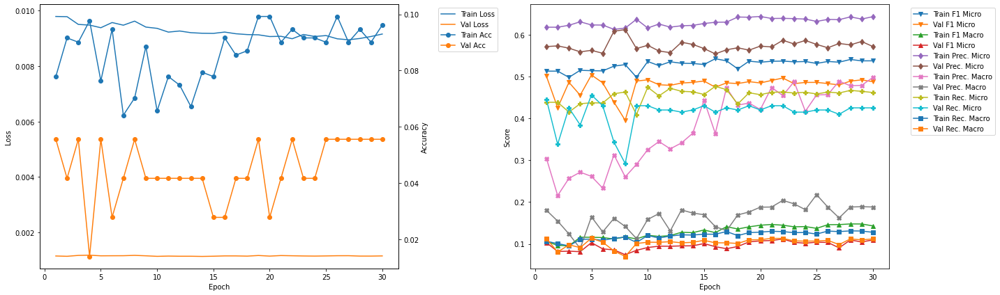

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.09
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5123 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.1086 	Validation F1 Macro: 0.1054
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.6122
Train Precision Marco: 0.2449 	Validation Precision Macro: 0.1622
Train Recall Mirco: 0.4413 	Validation Recall Micro: 0.4891
Train Recall Marco: 0.1095 	Validation Recall Macro: 0.1128

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.26
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5113 	Validation F1 Micro: 0.4615
Train F1 Marco: 0.1132 	Validation F1 Macro: 0.111
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.6471
Train Precision Marco: 0.2613 	Validation Precision Macro: 0.1253
Train Recall Mirco: 0.4373

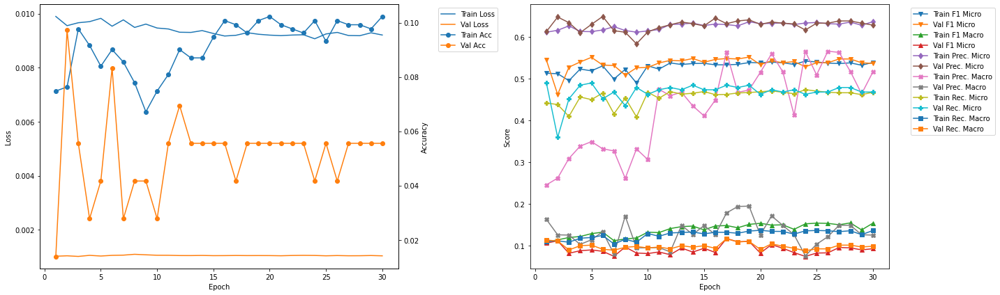

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 11
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0887 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4431 	Validation F1 Micro: 0.581
Train F1 Marco: 0.0762 	Validation F1 Macro: 0.0792
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6933
Train Precision Marco: 0.2009 	Validation Precision Macro: 0.0862
Train Recall Mirco: 0.3473 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0765 	Validation Recall Macro: 0.0934


In [23]:
densenet169LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0169 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0903 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0608 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1369 	Validation Precision Micro: 0.0
Train Precision Marco: 0.12 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0674 	Validation Recall Micro: 0.0
Train Recall Marco: 0.069 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.37
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0056 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0073 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2174 	Validation Precision Micro: 0.0
Train Precision Marco: 0.2045 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0029 	Validation Recall Micro: 0.0
Train Recall M

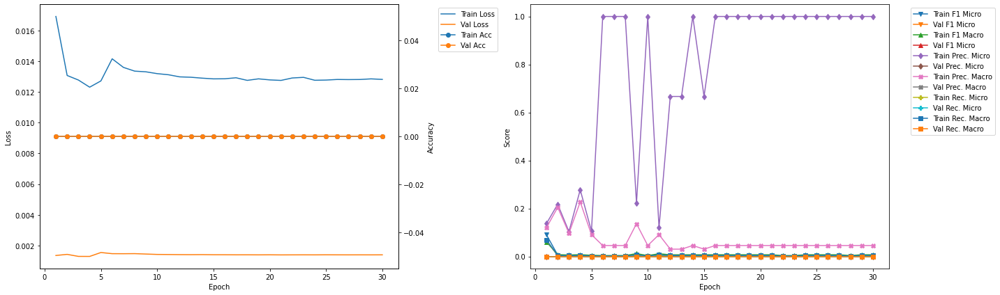

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.81
Train Loss: 0.0133 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0002 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0625 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0001 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.0
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Ma

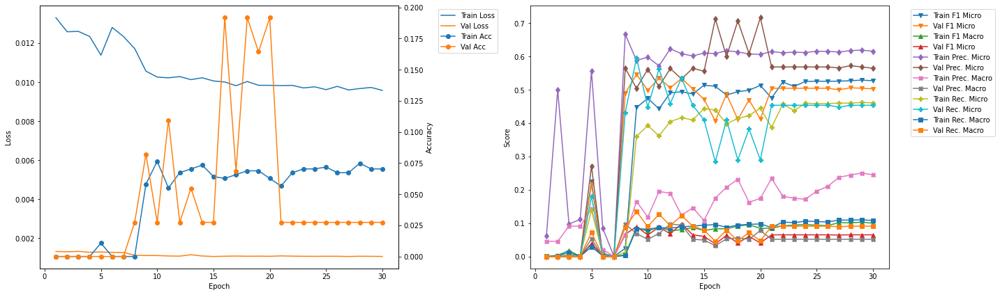

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.46
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.4606
Train F1 Marco: 0.0884 	Validation F1 Macro: 0.0643
Train Precision Mirco: 0.6012 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.183 	Validation Precision Macro: 0.0519
Train Recall Mirco: 0.3937 	Validation Recall Micro: 0.3858
Train Recall Marco: 0.0878 	Validation Recall Macro: 0.0843

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.65
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4849 	Validation F1 Micro: 0.4508
Train F1 Marco: 0.088 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6169 	Validation Precision Micro: 0.6017
Train Precision Marco: 0.1809 	Validation Precision Macro: 0.1
Train Recall Mirco: 0.3994 	Vali

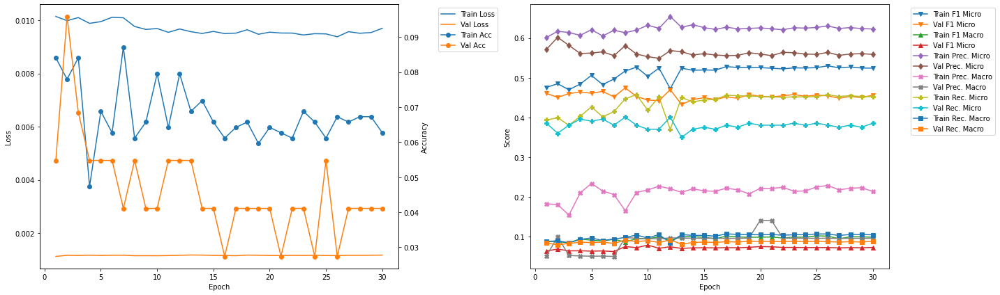

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.07
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4972 	Validation F1 Micro: 0.4561
Train F1 Marco: 0.093 	Validation F1 Macro: 0.102
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6915
Train Precision Marco: 0.1873 	Validation Precision Macro: 0.1589
Train Recall Mirco: 0.4237 	Validation Recall Micro: 0.3403
Train Recall Marco: 0.0974 	Validation Recall Macro: 0.0943

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.26
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0505 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4533 	Validation F1 Micro: 0.4774
Train F1 Marco: 0.0863 	Validation F1 Macro: 0.0908
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.6218
Train Precision Marco: 0.2303 	Validation Precision Macro: 0.0912
Train Recall Mirco: 0.3645 	Val

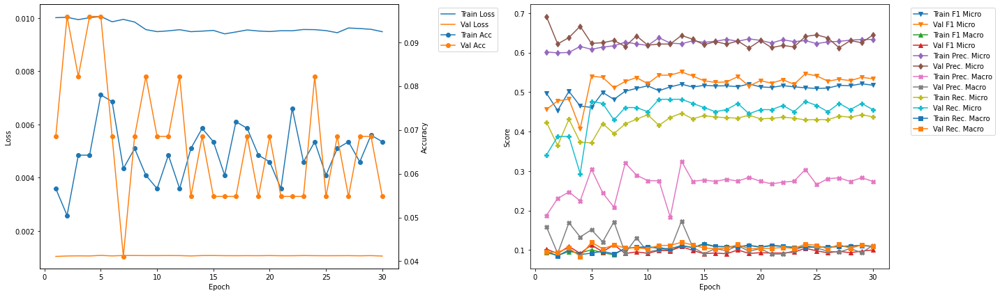

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.7
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0933 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4833 	Validation F1 Micro: 0.5337
Train F1 Marco: 0.1094 	Validation F1 Macro: 0.1063
Train Precision Mirco: 0.616 	Validation Precision Micro: 0.6127
Train Precision Marco: 0.2499 	Validation Precision Macro: 0.1246
Train Recall Mirco: 0.3976 	Validation Recall Micro: 0.4728
Train Recall Marco: 0.1018 	Validation Recall Macro: 0.1134

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.89
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4863 	Validation F1 Micro: 0.5337
Train F1 Marco: 0.0985 	Validation F1 Macro: 0.0862
Train Precision Mirco: 0.6232 	Validation Precision Micro: 0.6127
Train Precision Marco: 0.2159 	Validation Precision Macro: 0.1163
Train Recall Mirco: 0.3988 

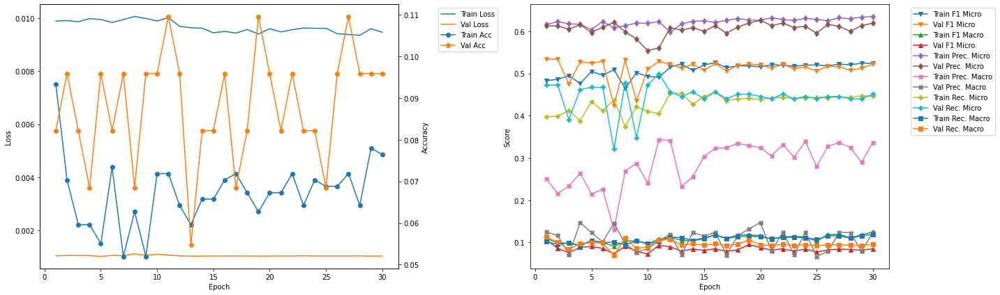

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.31
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4968 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0943 	Validation F1 Macro: 0.1038
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.232 	Validation Precision Macro: 0.0999
Train Recall Mirco: 0.4181 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0972 	Validation Recall Macro: 0.1198

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.5
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4701 	Validation F1 Micro: 0.503
Train F1 Marco: 0.1012 	Validation F1 Macro: 0.1018
Train Precision Mirco: 0.6162 	Validation Precision Micro: 0.5705
Train Precision Marco: 0.2176 	Validation Precision Macro: 0.1137
Train Recall Mirco: 0.38 	Valida

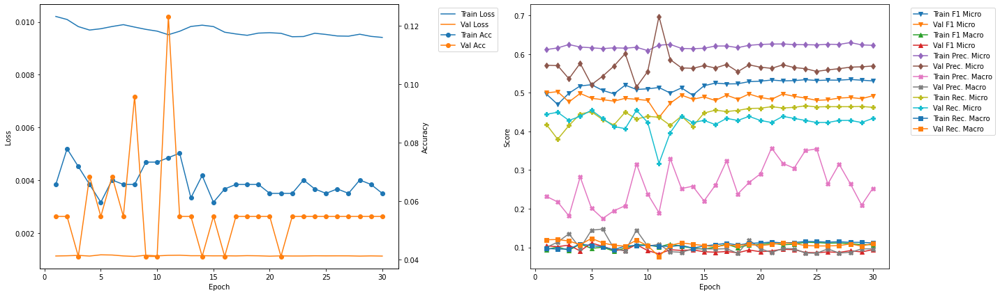

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.93
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4797 	Validation F1 Micro: 0.5378
Train F1 Marco: 0.0981 	Validation F1 Macro: 0.1031
Train Precision Mirco: 0.5784 	Validation Precision Micro: 0.6957
Train Precision Marco: 0.173 	Validation Precision Macro: 0.1696
Train Recall Mirco: 0.4097 	Validation Recall Micro: 0.4384
Train Recall Marco: 0.0972 	Validation Recall Macro: 0.1033

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.12
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5186 	Validation F1 Micro: 0.4658
Train F1 Marco: 0.101 	Validation F1 Macro: 0.0828
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.7282
Train Precision Marco: 0.2024 	Validation Precision Macro: 0.0971
Train Recall Mirco: 0.4514

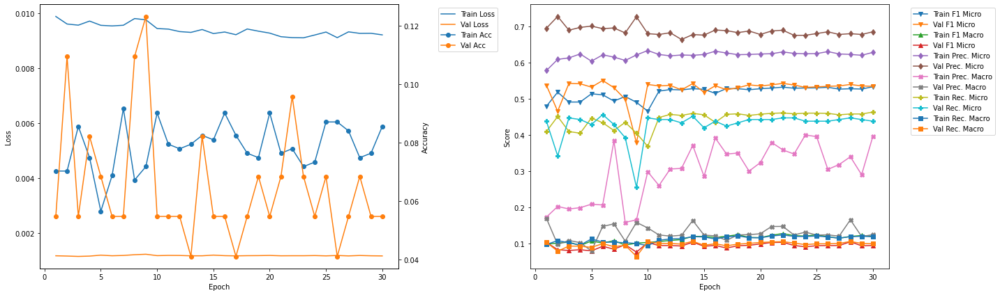

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.56
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5229 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.1057 	Validation F1 Macro: 0.1299
Train Precision Mirco: 0.6232 	Validation Precision Micro: 0.5696
Train Precision Marco: 0.3123 	Validation Precision Macro: 0.1616
Train Recall Mirco: 0.4504 	Validation Recall Micro: 0.4891
Train Recall Marco: 0.1078 	Validation Recall Macro: 0.1344

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.75
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5047 	Validation F1 Micro: 0.4938
Train F1 Marco: 0.1018 	Validation F1 Macro: 0.0902
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.2039 	Validation Precision Macro: 0.098
Train Recall Mirco: 0.4305 	V

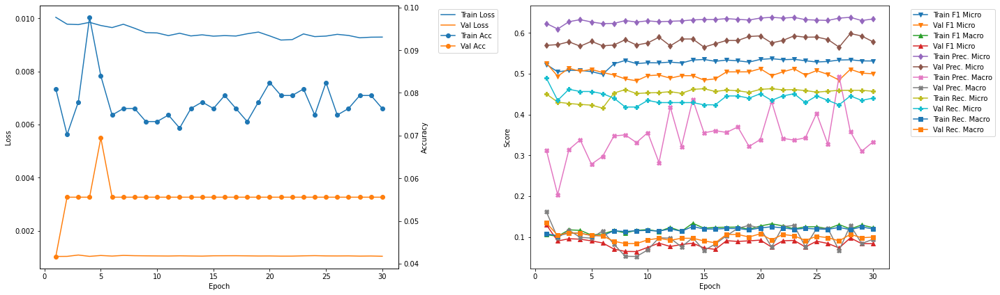

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.18
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5031 	Validation F1 Micro: 0.5284
Train F1 Marco: 0.1186 	Validation F1 Macro: 0.1321
Train Precision Mirco: 0.6245 	Validation Precision Micro: 0.5741
Train Precision Marco: 0.3718 	Validation Precision Macro: 0.1378
Train Recall Mirco: 0.4212 	Validation Recall Micro: 0.4895
Train Recall Marco: 0.11 	Validation Recall Macro: 0.1465

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.36
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5345 	Validation F1 Micro: 0.48
Train F1 Marco: 0.1177 	Validation F1 Macro: 0.1251
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.5778
Train Precision Marco: 0.3137 	Validation Precision Macro: 0.1617
Train Recall Mirco: 0.4718 	

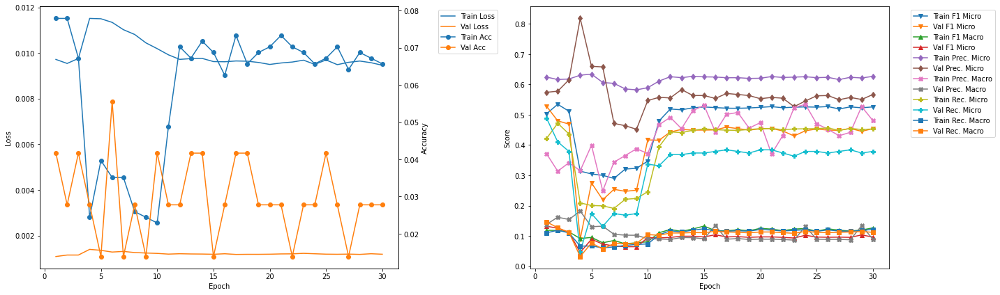

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.79
Train Loss: 0.0107 	Validation Loss: 0.0013
Train Accuracy: 0.0489 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.3709 	Validation F1 Micro: 0.3649
Train F1 Marco: 0.0937 	Validation F1 Macro: 0.1116
Train Precision Mirco: 0.5685 	Validation Precision Micro: 0.6585
Train Precision Marco: 0.247 	Validation Precision Macro: 0.2437
Train Recall Mirco: 0.2752 	Validation Recall Micro: 0.2523
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.98
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0626 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4526 	Validation F1 Micro: 0.4458
Train F1 Marco: 0.1086 	Validation F1 Macro: 0.1221
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6271
Train Precision Marco: 0.3422 	Validation Precision Macro: 0.197
Train Recall Mirco: 0.360

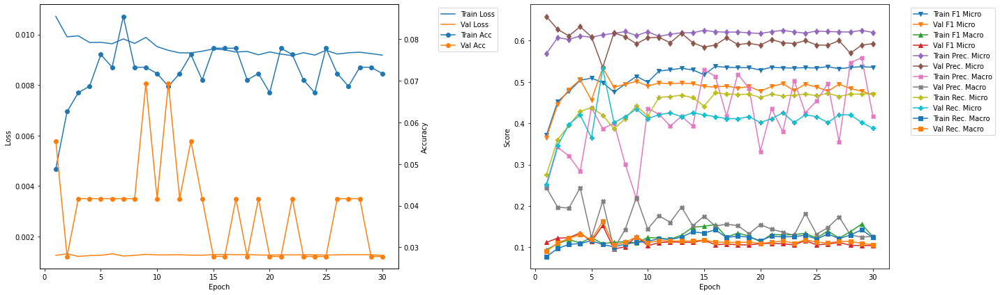

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 6
Train Loss: 0.0095 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5112 	Validation F1 Micro: 0.551
Train F1 Marco: 0.1011 	Validation F1 Macro: 0.0922
Train Precision Mirco: 0.6219 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.2064 	Validation Precision Macro: 0.1472
Train Recall Mirco: 0.434 	Validation Recall Micro: 0.4566
Train Recall Marco: 0.104 	Validation Recall Macro: 0.0995


In [24]:
densenet201LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0176 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

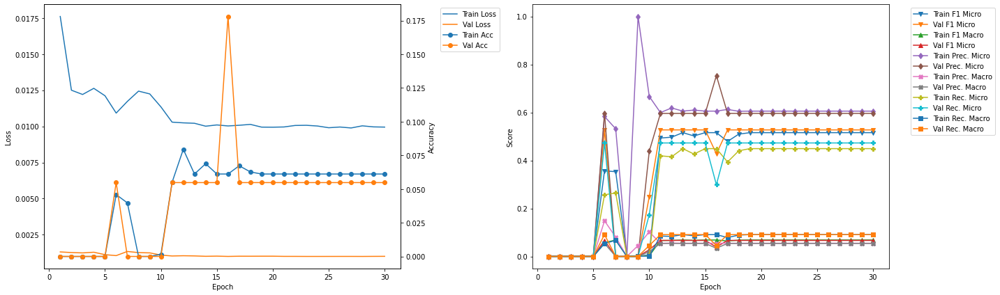

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.86
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5067 	Validation F1 Micro: 0.4912
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4318 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0859 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.04
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5236 	Validation F1 Micro: 0.342
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0725 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4649 

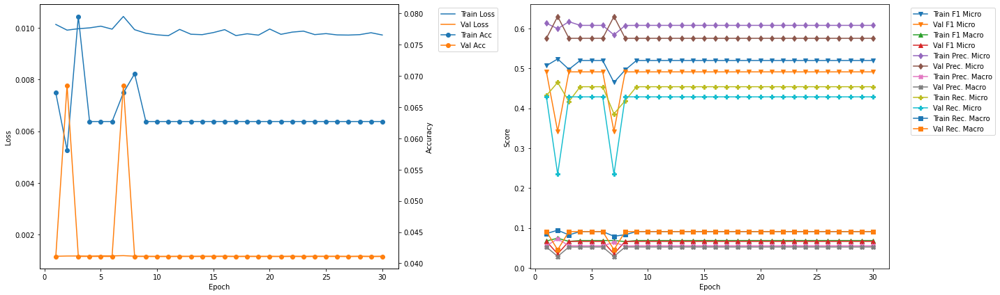

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.5
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5055 	Validation F1 Micro: 0.5134
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0671
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.43 	Validation Recall Micro: 0.455
Train Recall Marco: 0.0862 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.69
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5173 	Validation F1 Micro: 0.5134
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0671
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4511 	Valida

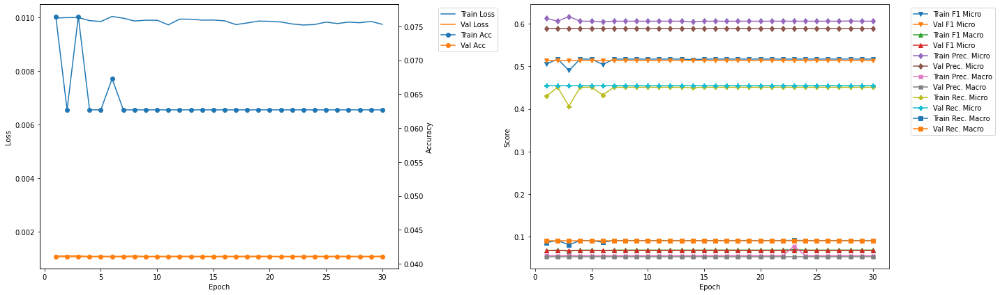

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.15
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4699 	Validation F1 Micro: 0.4
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0399
Train Precision Mirco: 0.5919 	Validation Precision Micro: 0.7808
Train Precision Marco: 0.0888 	Validation Precision Macro: 0.0355
Train Recall Mirco: 0.3896 	Validation Recall Micro: 0.2689
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.34
Train Loss: 0.0121 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1471 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0318 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4041 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0713 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0899 	Validation Rec

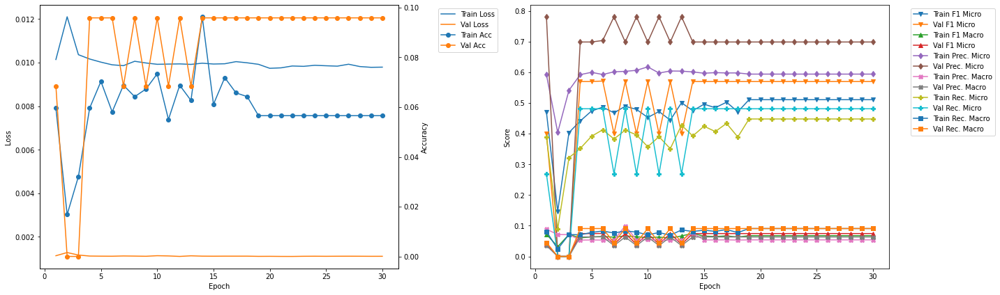

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.83
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.4797 	Validation F1 Micro: 0.3358
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6205 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.391 	Validation Recall Micro: 0.2308
Train Recall Marco: 0.0766 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.02
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4748 	Validation F1 Micro: 0.4809
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6214 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.3841

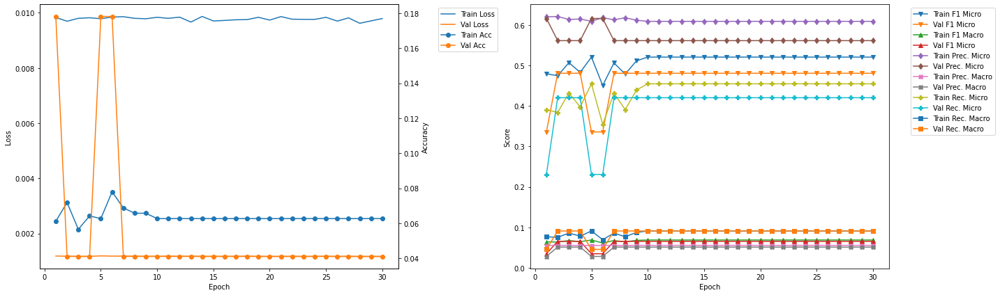

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.49
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.052 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5097 	Validation F1 Micro: 0.4699
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4386 	Validation Recall Micro: 0.4039
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.68
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4832 	Validation F1 Micro: 0.4699
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.395

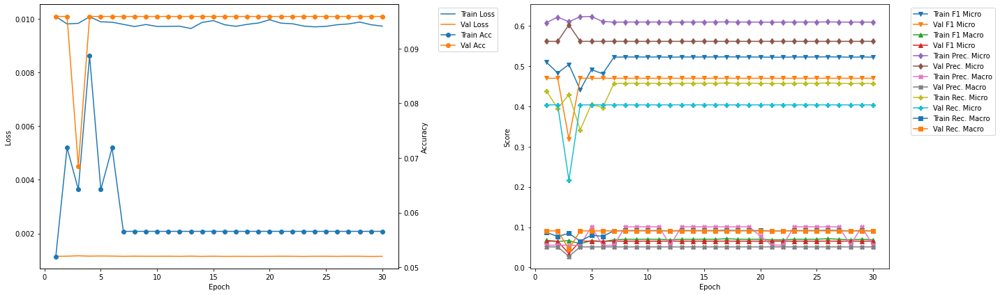

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.14
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4505 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0606 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6185 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3542 	Validation Recall Micro: 0.4845
Train Recall Marco: 0.0698 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.33
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4983 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.42

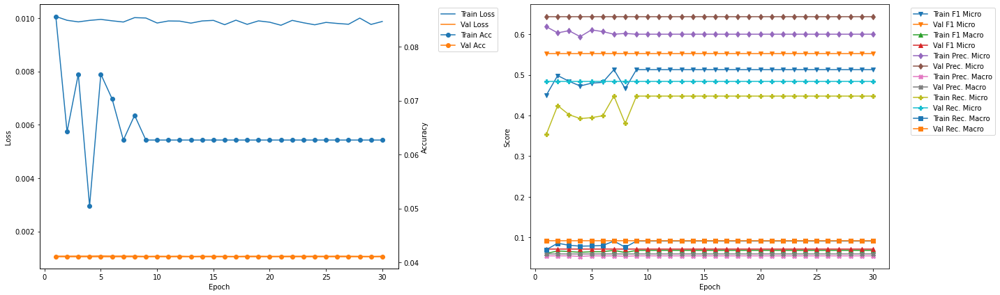

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.81
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4722 	Validation F1 Micro: 0.5444
Train F1 Marco: 0.0703 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6284 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0675 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.3782 	Validation Recall Micro: 0.4742
Train Recall Marco: 0.0792 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.0
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4888 	Validation F1 Micro: 0.5444
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4062 	Va

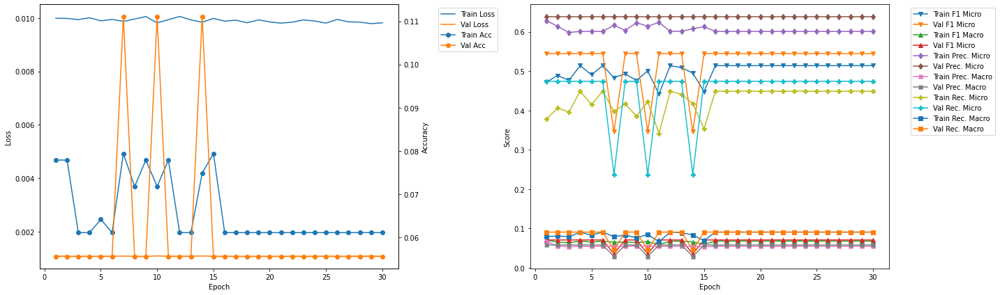

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.46
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4964 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.4201 	Validation Recall Micro: 0.47
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.65
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5059 	Validation F1 Micro: 0.3603
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0368
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0309
Train Recall Mirco: 0.439 	V

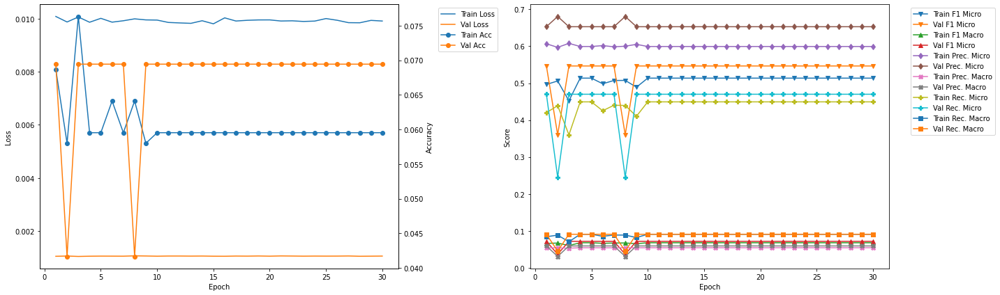

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.11
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5219 	Validation F1 Micro: 0.4691
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0627
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.048
Train Recall Mirco: 0.4544 	Validation Recall Micro: 0.4222
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.29
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.492 	Validation F1 Micro: 0.4691
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0627
Train Precision Mirco: 0.6144 	Validation Precision Micro: 0.5278
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.048
Train Recall Mirco: 0.4103 

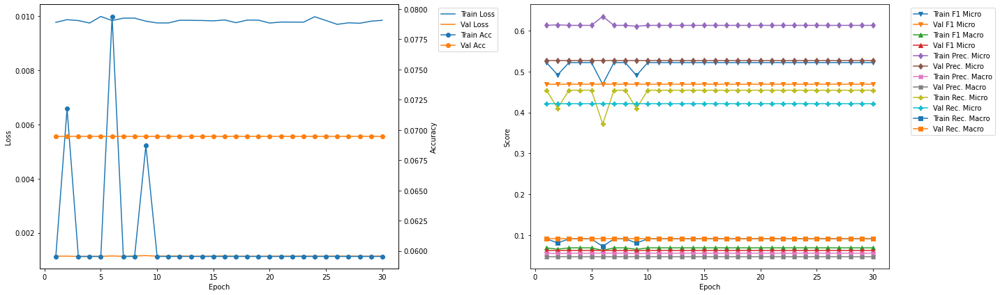

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4866 	Validation F1 Micro: 0.5714
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0748
Train Precision Mirco: 0.5927 	Validation Precision Micro: 0.7034
Train Precision Marco: 0.0534 	Validation Precision Macro: 0.0639
Train Recall Mirco: 0.4127 	Validation Recall Micro: 0.4811
Train Recall Marco: 0.083 	Validation Recall Macro: 0.0909


In [25]:
vgg11bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0165 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0609 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0565 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1233 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1246 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0404 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0696 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

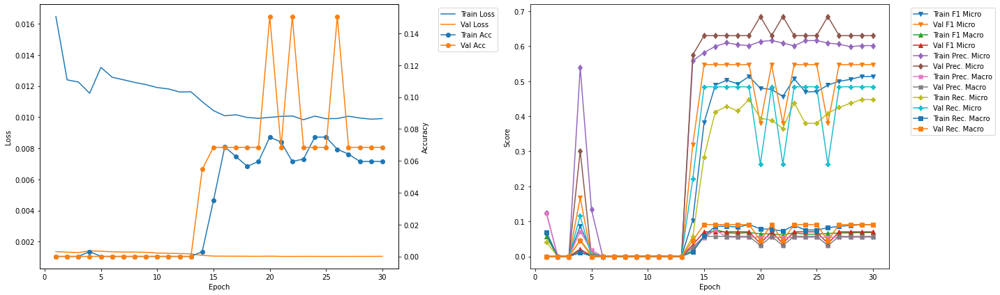

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.3
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.055 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0104 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.416 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0591 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0294 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0057 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.5
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

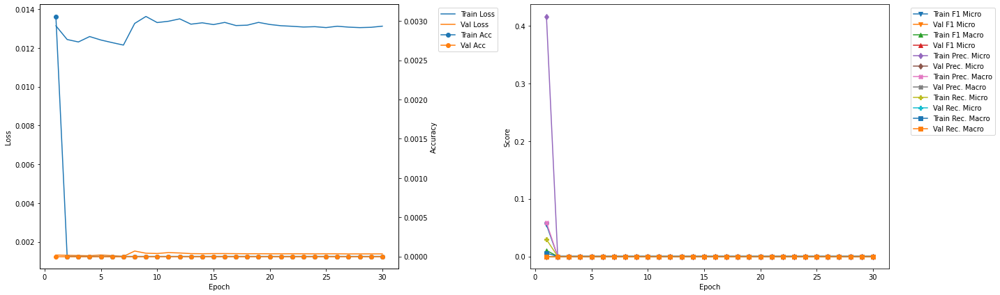

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.35
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.55
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

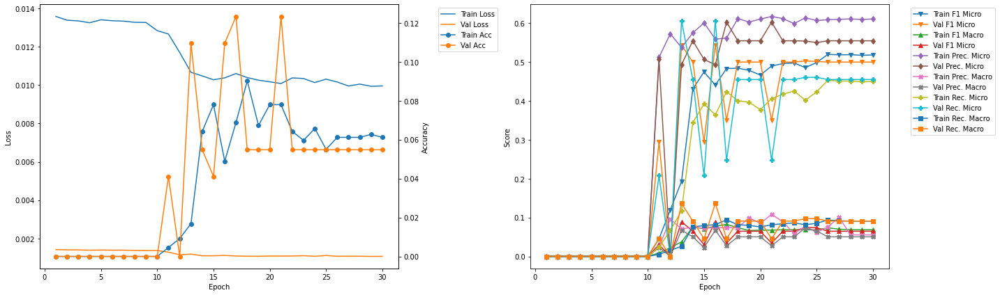

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.41
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4792 	Validation F1 Micro: 0.5242
Train F1 Marco: 0.0792 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.5909 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0887 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.403 	Validation Recall Micro: 0.4488
Train Recall Marco: 0.0862 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.61
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.4014
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0477
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.7215
Train Precision Marco: 0.0659 	Validation Precision Macro: 0.0703
Train Recall Mirco: 0.4099 

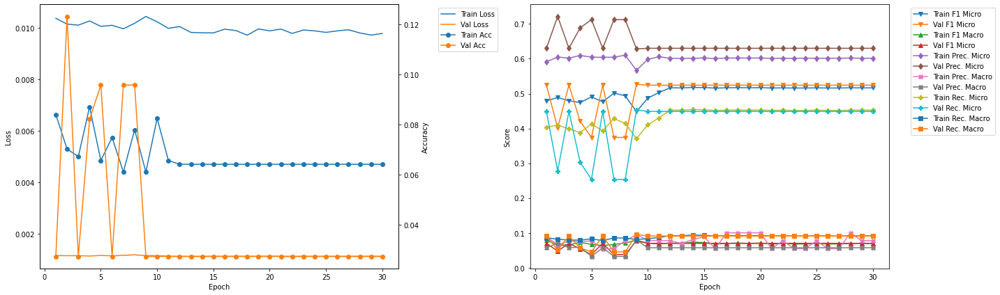

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.47
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4897 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.5913 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0815 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4179 	Validation Recall Micro: 0.4255
Train Recall Marco: 0.086 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.67
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.479
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.1007 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4133 	Va

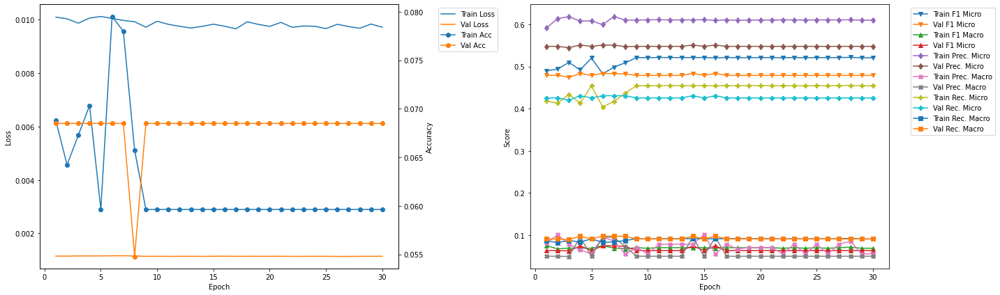

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.52
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4555 	Validation F1 Micro: 0.5439
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.091 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3644 	Validation Recall Micro: 0.4638
Train Recall Marco: 0.0752 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.547619 --> 0.591549).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.74
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.4855 	Validation F1 Micro: 0.5915
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0982
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5753
Train Precisi

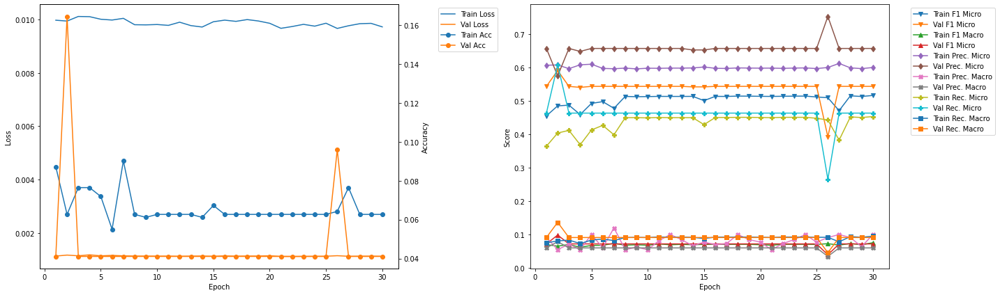

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.59
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.4955
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.5892 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0735 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4174 	Validation Recall Micro: 0.4346
Train Recall Marco: 0.0848 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.79
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4985 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.1171 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.422 	

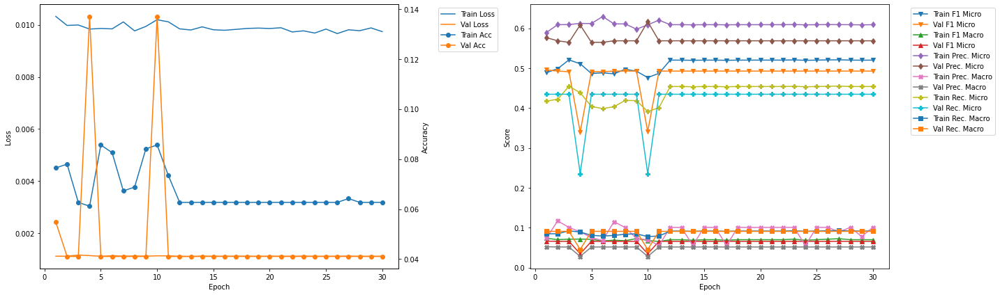

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.65
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4698 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6113 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0867 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3815 	Validation Recall Micro: 0.466
Train Recall Marco: 0.077 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.85
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4615 	Validation F1 Micro: 0.5298
Train F1 Marco: 0.0618 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.6138
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3702 

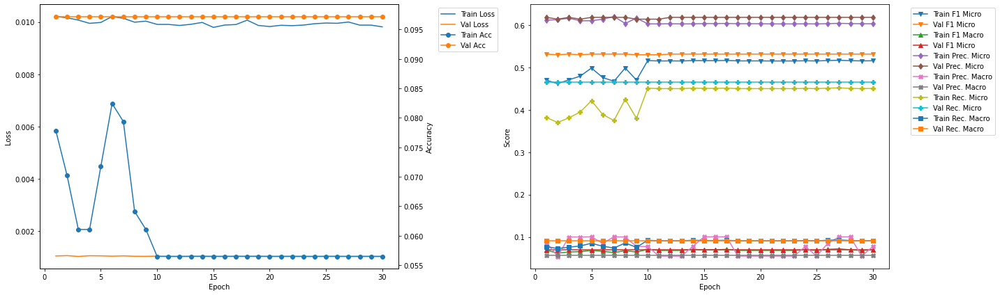

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.7
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4916 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.1008 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.4094 	Validation Recall Micro: 0.4483
Train Recall Marco: 0.0823 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.9
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0772 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.426 	Va

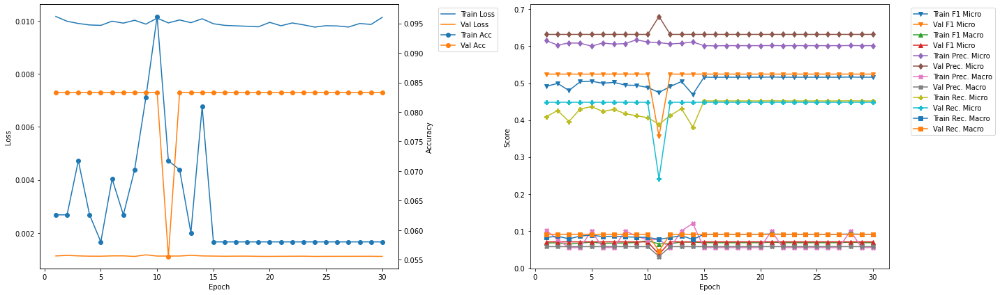

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.75
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0809 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4631 	Validation F1 Micro: 0.5098
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6104 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.3731 	Validation Recall Micro: 0.4272
Train Recall Marco: 0.0731 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.95
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4859 	Validation F1 Micro: 0.5098
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.4083

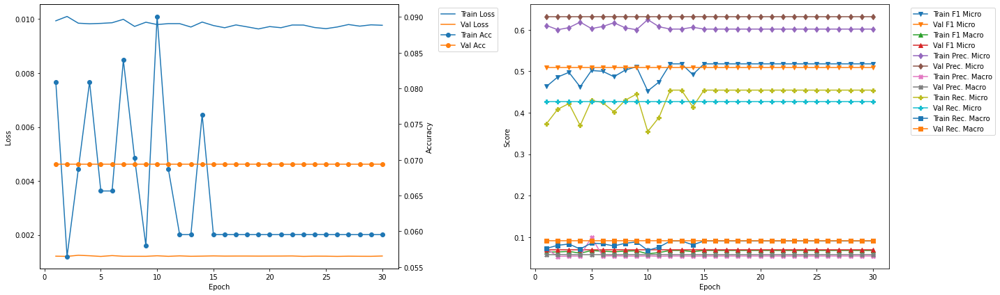

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 2
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.4855 	Validation F1 Micro: 0.5915
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0982
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0785
Train Recall Mirco: 0.404 	Validation Recall Micro: 0.6087
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.1364


In [26]:
vgg16bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0237 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.097 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0598 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1425 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1235 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0735 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

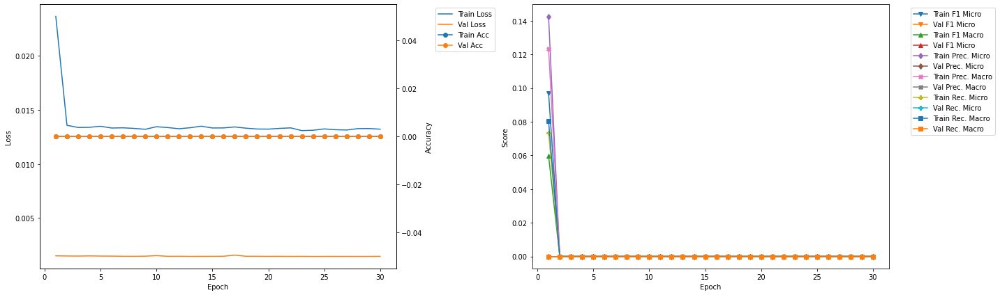

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.49
Train Loss: 0.0142 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0316 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0207 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1159 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0582 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0183 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0281 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.7
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

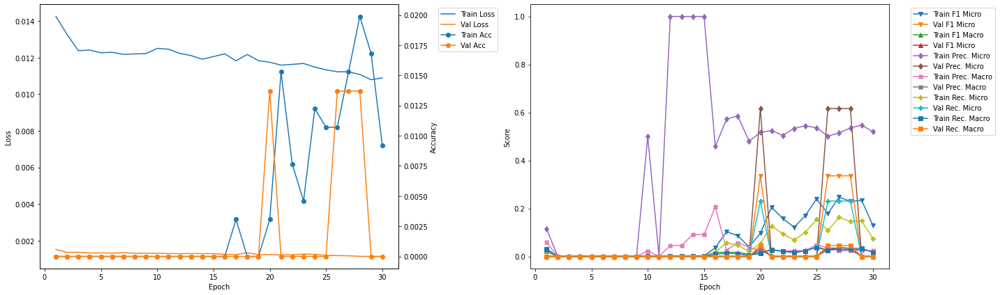

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.78
Train Loss: 0.011 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2327 	Validation F1 Micro: 0.2595
Train F1 Marco: 0.0447 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.4856 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0782 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.153 	Validation Recall Micro: 0.1799
Train Recall Marco: 0.0448 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.99
Train Loss: 0.0109 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2311 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0315 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5432 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0467 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1468 	Validation Re

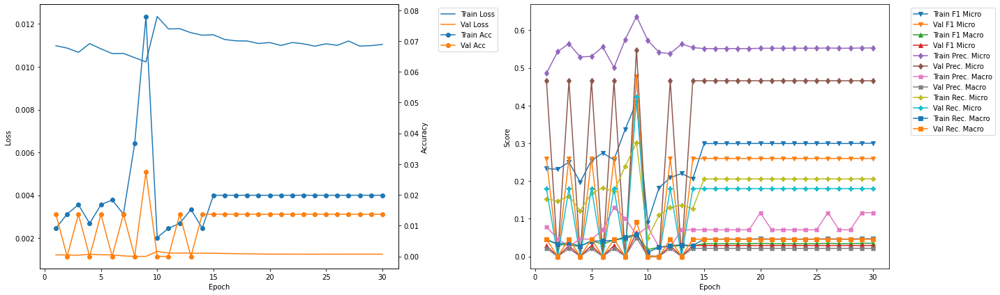

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.08
Train Loss: 0.0116 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2176 	Validation F1 Micro: 0.2759
Train F1 Marco: 0.0325 	Validation F1 Macro: 0.03
Train Precision Mirco: 0.5285 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.1341 	Validation Precision Macro: 0.0224
Train Recall Mirco: 0.137 	Validation Recall Micro: 0.1915
Train Recall Marco: 0.0323 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.477612 --> 0.508982).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.31
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0107 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.2112 	Validation F1 Micro: 0.509
Train F1 Marco: 0.0274 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.5043 	Validation Precision Micro: 0.5822
Train Precision M

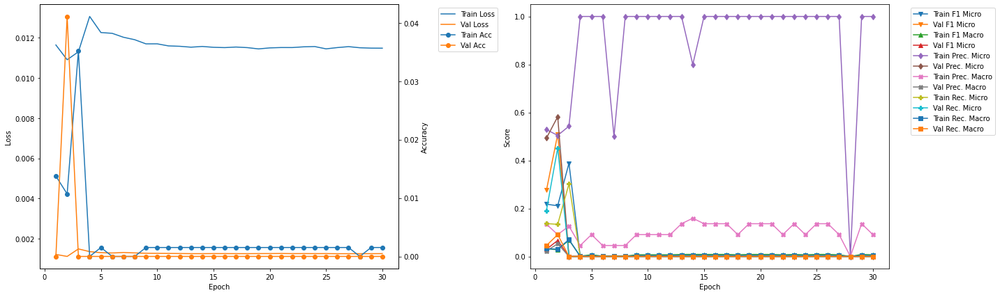

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.37
Train Loss: 0.0121 	Validation Loss: 0.0013
Train Accuracy: 0.0092 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1232 	Validation F1 Micro: 0.0
Train F1 Marco: 0.035 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.431 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1745 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0719 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0263 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.58
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0107 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.1831 	Validation F1 Micro: 0.306
Train F1 Marco: 0.0327 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.5655 	Validation Precision Micro: 0.589
Train Precision Marco: 0.162 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.1093 	Validation Recall Micr

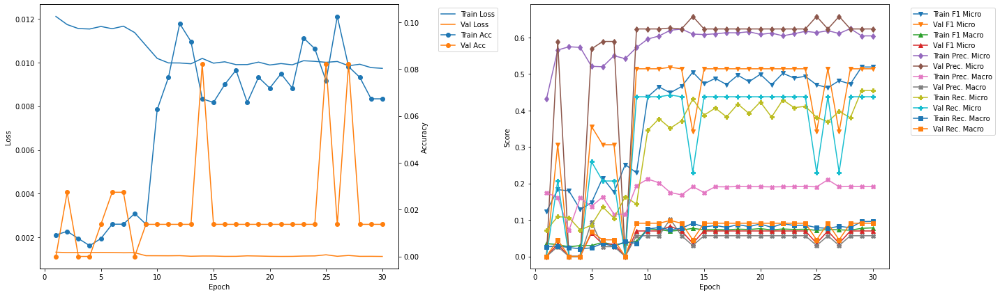

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.518310 --> 0.526316).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 31.72
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4775 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0769 	Validation F1 Macro: 0.0833
Train Precision Mirco: 0.5926 	Validation Precision Micro: 0.6081
Train Precision Marco: 0.1625 	Validation Precision Macro: 0.1002
Train Recall Mirco: 0.3999 	Validation Recall Micro: 0.4639
Train Recall Marco: 0.0849 	Validation Recall Macro: 0.1

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.93
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4847 	Validation F1 Micro: 0.3731
Train F1 Marco: 0.0723 	Validation F1 Macro: 0.0448
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.6757
Train Precision

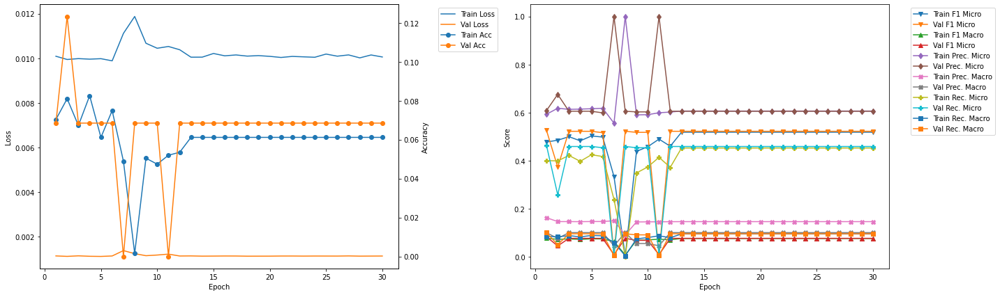

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.526316 --> 0.534060).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 38.02
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0474 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4511 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.062 	Validation F1 Macro: 0.1038
Train Precision Mirco: 0.5936 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.1515
Train Recall Mirco: 0.3638 	Validation Recall Micro: 0.4434
Train Recall Marco: 0.074 	Validation Recall Macro: 0.1098

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.23
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0535 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4757 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.1038
Train Precision Mirco: 0.5924 	Validation Precision Micro: 0.6712
Train Precis

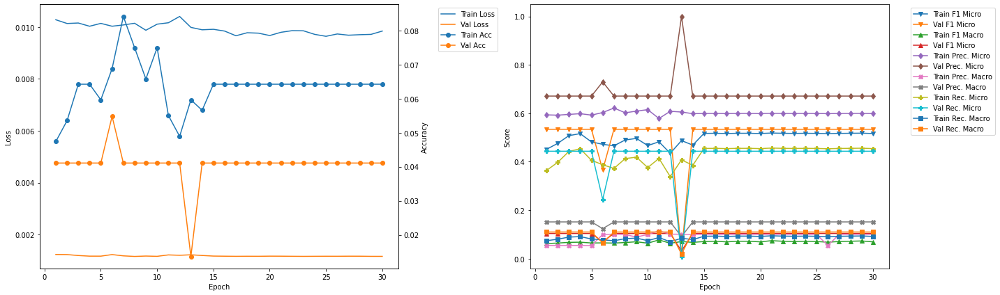

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.29
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0519 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4697 	Validation F1 Micro: 0.4206
Train F1 Marco: 0.0841 	Validation F1 Macro: 0.0385
Train Precision Mirco: 0.5842 	Validation Precision Micro: 0.7361
Train Precision Marco: 0.1975 	Validation Precision Macro: 0.0335
Train Recall Mirco: 0.3928 	Validation Recall Micro: 0.2944
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.534060 --> 0.549383).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.51
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4819 	Validation F1 Micro: 0.5494
Train F1 Marco: 0.0739 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6181
Train Precisio

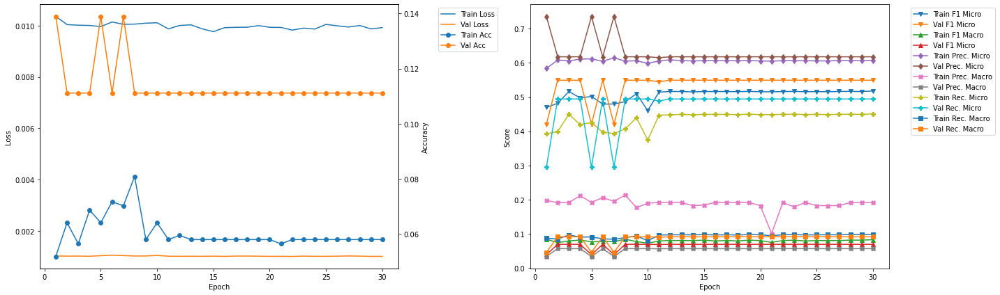

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.549383 --> 0.553191).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 50.6
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4882 	Validation F1 Micro: 0.5532
Train F1 Marco: 0.0808 	Validation F1 Macro: 0.0785
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6364
Train Precision Marco: 0.1855 	Validation Precision Macro: 0.0807
Train Recall Mirco: 0.4111 	Validation Recall Micro: 0.4892
Train Recall Marco: 0.0899 	Validation Recall Macro: 0.0939

Validation F1 Micro Score Increased (0.553191 --> 0.560241).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.83
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.5602
Train F1 Marco: 0.0797 	Validation F1 Macro: 0.0791
T

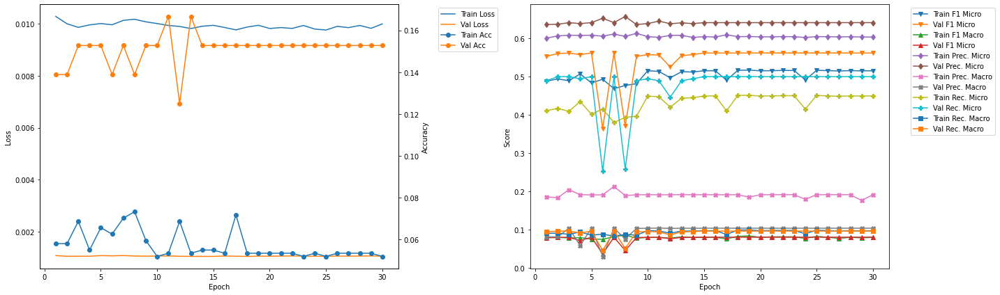

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.93
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4737 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0813 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6019 	Validation Precision Micro: 0.5594
Train Precision Marco: 0.2057 	Validation Precision Macro: 0.0508
Train Recall Mirco: 0.3905 	Validation Recall Micro: 0.4145
Train Recall Marco: 0.0842 	Validation Recall Macro: 0.0897

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4923 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0799 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.6161 	Validation Precision Micro: 0.5594
Train Precision Marco: 0.18 	Validation Precision Macro: 0.0508
Train Recall Mirco: 0.4099 

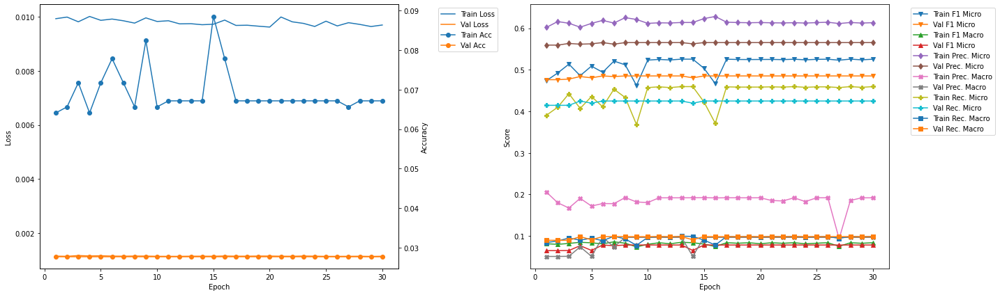

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 3
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.4895 	Validation F1 Micro: 0.5619
Train F1 Marco: 0.0779 	Validation F1 Macro: 0.08
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.6414
Train Precision Marco: 0.2042 	Validation Precision Macro: 0.1035
Train Recall Mirco: 0.4094 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.096


In [27]:
vgg19bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_0')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:42:11


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_0_best,
    'ResNet50' : resnet50LSTM_700_1_0_best,
    'ResNet101' : resnet101LSTM_700_1_0_best,
    'DenseNet121' : densenet121LSTM_700_1_0_best,
    'DenseNet169' : densenet169LSTM_700_1_0_best,
    'DenseNet201' : densenet201LSTM_700_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,1.000000,4.000000,2.000000,8.000000,4.000000,7.000000,4.000000,6.000000,9.000000
Epoch,15.000000,1.000000,3.000000,5.000000,11.000000,6.000000,6.000000,2.000000,3.000000
Train Loss,0.010313,0.010154,0.010241,0.009721,0.009906,0.009545,0.009900,0.009944,0.009858
Train Accuracy,0.042813,0.077982,0.067278,0.065649,0.088685,0.068807,0.058104,0.062691,0.068702
Train F1 Micro,0.415350,0.474390,0.443569,0.502509,0.443140,0.511247,0.486578,0.485497,0.489477
Train F1 Macro,0.058278,0.071521,0.059722,0.100973,0.076224,0.101100,0.064955,0.065089,0.077923
Train Precision Micro,0.591640,0.597920,0.601555,0.607605,0.611955,0.621891,0.592715,0.608131,0.608439
Train Precision Macro,0.054261,0.073128,0.052950,0.305683,0.200868,0.206443,0.053377,0.054605,0.204162
Train Recall Micro,0.320000,0.393162,0.351305,0.428408,0.347326,0.434028,0.412680,0.404023,0.409426
Train Recall Macro,0.064088,0.080640,0.069832,0.102031,0.076538,0.104015,0.082964,0.080608,0.087462


In [30]:
summaryDF.to_csv('BestCnnRnnModels/BestModels_700_1_0.csv')

### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

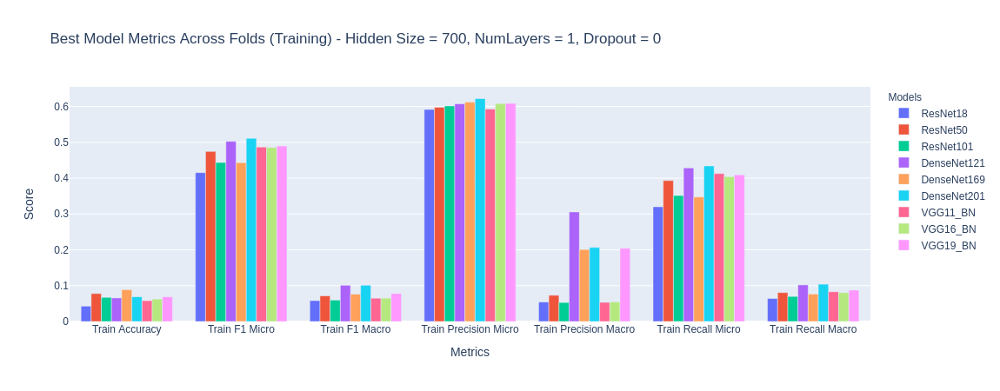

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

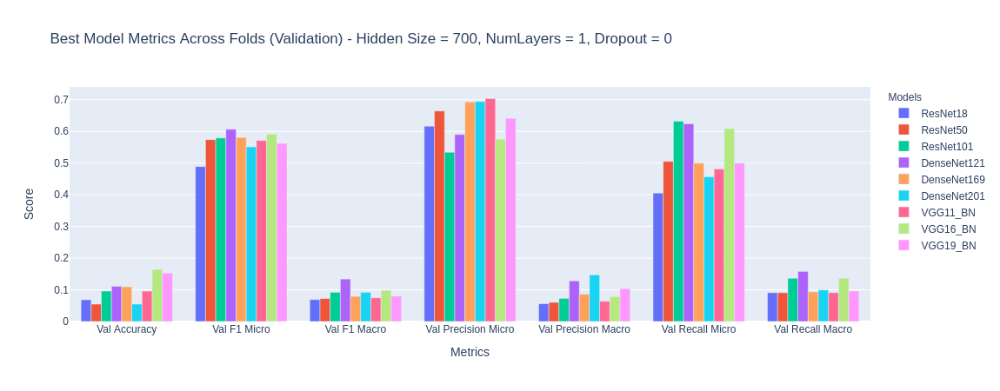

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()